# <center> Предсказание победителя в Dota 2
<center> <img src="https://meduza.io/impro/YnJZAHUW6WHz_JQm1uRPkTql_qAhbfxt3oFJLGH7CJg/fill/980/0/ce/1/aHR0cHM6Ly9tZWR1/emEuaW8vaW1hZ2Uv/YXR0YWNobWVudHMv/aW1hZ2VzLzAwNy8x/NTcvNjk1L29yaWdp/bmFsL0tMVThLbUti/ZG5pSzlibDA0Wmlw/WXcuanBn.webp" width="700" height="700">

[Почитать подбробнее](https://meduza.io/feature/2021/10/19/rossiyskaya-komanda-vyigrala-chempionat-mira-po-dota-2-i-poluchila-18-millionov-dollarov-postoyte-otkuda-takie-dengi-neuzheli-igrat-v-dotu-tak-slozhno)

#### [Оригинальная статья](https://arxiv.org/pdf/2106.01782.pdf)
    
### Начало

Посмотрим на готовые признаки и сделаем первую посылку. 

1. [Описание данных](#Описание-данных)
2. [Описание признаков](#Описание-признаков)
3. [Наша первая модель](#Наша-первая-модель)
4. [Посылка](#Посылка)

### Первые шаги на пути в датасайенс

5. [Кросс-валидация](#Кросс-валидация)
6. [Что есть в json файлах?](#Что-есть-в-json-файлах?)
7. [Feature engineering](#Feature-engineering)

### Импорты

In [1]:
import os
import json
import numpy as np
import pandas as pd
import datetime
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, ShuffleSplit, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, accuracy_score

import xgboost
import lightgbm
import catboost
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB

from matplotlib.colors import ListedColormap
from scipy.stats import pearsonr
from itertools import combinations
from sklearn.base import BaseEstimator
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.ensemble import (RandomForestClassifier,
                              ExtraTreesClassifier,
                              VotingClassifier)
from sklearn.model_selection import GridSearchCV, cross_val_score, KFold
from sklearn.tree import (DecisionTreeRegressor,
                          DecisionTreeClassifier)
from sklearn.metrics import (precision_score, recall_score, f1_score, accuracy_score,
                             confusion_matrix, ConfusionMatrixDisplay, RocCurveDisplay,
                             roc_curve, auc, roc_auc_score, classification_report)

from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score

from imblearn.over_sampling import RandomOverSampler
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer

%matplotlib inline

In [2]:
SEED = 10801
sns.set_style(style="whitegrid")
plt.rcParams["figure.figsize"] = 12, 8
warnings.filterwarnings("ignore")

## <left>Описание данных

Файлы:

- `sample_submission.csv`: пример файла-посылки
- `train_raw_data.jsonl`, `test_raw_data.jsonl`: "сырые" данные 
- `train_data.csv`, `test_data.csv`: признаки, созданные авторами
- `train_targets.csv`: результаты тренировочных игр

## <left>Описание признаков
    
Набор простых признаков, описывающих игроков и команды в целом

In [3]:
PATH_TO_DATA = "/home/IB_ML/Homework5_dota/"

df_train_features = pd.read_csv(os.path.join(PATH_TO_DATA, 
                                             "train_data.csv"), 
                                    index_col="match_id_hash")
df_train_targets = pd.read_csv(os.path.join(PATH_TO_DATA, 
                                            "train_targets.csv"), 
                                   index_col="match_id_hash")

In [4]:
df_train_features.shape

(31698, 245)

In [5]:
df_train_features.head()

,game_time,game_mode,lobby_type,objectives_len,chat_len,r1_hero_id,r1_kills,r1_deaths,r1_assists,r1_denies,...,d5_stuns,d5_creeps_stacked,d5_camps_stacked,d5_rune_pickups,d5_firstblood_claimed,d5_teamfight_participation,d5_towers_killed,d5_roshans_killed,d5_obs_placed,d5_sen_placed
match_id_hash,,,,,,,,,,,,,,,,,,,,,
b9c57c450ce74a2af79c9ce96fac144d,658,4,0,3,10,15,7,2,0,7,...,0.000000,0,0,0,0,0.00,0,0,0,0
6db558535151ea18ca70a6892197db41,21,23,0,0,0,101,0,0,0,0,...,0.000000,0,0,0,0,0.00,0,0,0,0
19c39fe2af2b547e48708ca005c6ae74,160,22,7,0,0,57,0,0,0,1,...,0.000000,0,0,0,0,0.00,0,0,0,0
c96d629dc0c39f0c616d1949938a6ba6,1016,22,0,1,0,119,0,3,3,5,...,8.264696,0,0,3,0,0.25,0,0,3,0
156c88bff4e9c4668b0f53df3d870f1b,582,22,7,2,2,12,3,1,2,9,...,15.762911,3,1,0,1,0.50,0,0,3,0


Имеем ~32 тысячи наблюдений, каждое из которых характеризуется уникальным `match_id_hash` (захэшированное id матча), и 245 признаков. `game_time` показывает момент времени, в который получены эти данные. То есть по сути это не длительность самого матча, а например, его середина, таким образом, в итоге мы сможем получить модель, которая будет предсказывать вероятность победы каждой из команд в течение матча (хорошо подходит для букмекеров).

Нас интересует поле `radiant_win` (так называется одна из команд, вторая - dire). Остальные колоки здесь по сути получены из "будущего" и есть только для тренировочных данных, поэтому на них можно просто посмотреть).

In [6]:
df_train_targets.head()

,game_time,radiant_win,duration,time_remaining,next_roshan_team
match_id_hash,,,,,
b9c57c450ce74a2af79c9ce96fac144d,658,True,1154,496,NaN
6db558535151ea18ca70a6892197db41,21,True,1503,1482,Radiant
19c39fe2af2b547e48708ca005c6ae74,160,False,2063,1903,NaN
c96d629dc0c39f0c616d1949938a6ba6,1016,True,2147,1131,Radiant
156c88bff4e9c4668b0f53df3d870f1b,582,False,1927,1345,Dire


## <left>Наша первая модель

In [7]:
X = df_train_features.values
y = df_train_targets["radiant_win"].values.astype("int8")

In [8]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, 
                                                      test_size=0.3, 
                                                      random_state=SEED)

In [9]:
X_train.shape, y_train.shape, X_valid.shape, y_valid.shape

((22188, 245), (22188,), (9510, 245), (9510,))

#### Обучим случайный лес

In [59]:
%%time
rf_model = RandomForestClassifier(n_estimators=300, max_depth=7, n_jobs=-1, random_state=SEED)
rf_model.fit(X_train, y_train)

CPU times: user 22.4 s, sys: 230 ms, total: 22.6 s
Wall time: 1.62 s


RandomForestClassifier(max_depth=7, n_estimators=300, n_jobs=-1,
                       random_state=10801)

#### Сделаем предсказания и оценим качество на отложенной части данных

In [11]:
y_pred = rf_model.predict_proba(X_valid)[:, 1]

In [12]:
valid_score = roc_auc_score(y_valid, y_pred)
print("ROC-AUC score на отложенной части:", valid_score)

ROC-AUC score на отложенной части: 0.7754387258058622


Посмотрим на accuracy:

In [13]:
valid_accuracy = accuracy_score(y_valid, y_pred > 0.5)
print("Accuracy score (p > 0.5) на отложенной части:", valid_accuracy)

Accuracy score (p > 0.5) на отложенной части: 0.6885383806519453


## <left>Посылка

## <left>Посылка

In [60]:
df_test_features = pd.read_csv(os.path.join(PATH_TO_DATA, "test_data.csv"), 
                                   index_col="match_id_hash")

X_test = df_test_features.values
y_test_pred = rf_model.predict_proba(X_test)[:, 1]

df_submission = pd.DataFrame({"radiant_win_prob": y_test_pred}, 
                                 index=df_test_features.index)

In [16]:
submission_filename = "submission_{}.csv".format(
    datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S"))
df_submission.to_csv(submission_filename)
print("Файл посылки сохранен, как: {}".format(submission_filename))

Файл посылки сохранен, как: submission_2023-04-09_21-15-53.csv


## <left>Кросс-валидация

Во многих случаях кросс-валидация оказывается лучше простого разбиения на test и train. Воспользуемся `ShuffleSplit` чтобы создать 5 70%/30% наборов данных.

In [14]:
cv = ShuffleSplit(n_splits=5, test_size=0.3, random_state=SEED)

In [15]:
%%time
rf_model = RandomForestClassifier(n_estimators=300, max_depth=7, n_jobs=-1, random_state=SEED)
cv_scores_rf = cross_val_score(rf_model, X, y, cv=cv, scoring="roc_auc")

CPU times: user 4.67 s, sys: 811 ms, total: 5.48 s
Wall time: 14.3 s


In [16]:
cv_scores_rf

array([0.77543873, 0.77343884, 0.76649967, 0.7722681 , 0.77246001])

In [17]:
print(f"Среднее значение ROC-AUC на кросс-валидации: {cv_scores_rf.mean()}")

Среднее значение ROC-AUC на кросс-валидации: 0.7720210676055513


## <left>Что есть в json файлах?

Описание сырых данных можно найти в `train_matches.jsonl` и `test_matches.jsonl`. Каждый файл содержит одну запись для каждого матча в [JSON](https://en.wikipedia.org/wiki/JSON) формате. Его легко превратить в питоновский объект при помощи метода `json.loads`.

In [18]:
with open(os.path.join(PATH_TO_DATA, "train_raw_data.jsonl")) as fin:
    # прочтем 419 строку
    for i in range(419):
        line = fin.readline()
    
    # переведем JSON в питоновский словарь 
    match = json.loads(line)

In [19]:
player = match["players"][9]
player["kills"], player["deaths"], player["assists"]

(0, 5, 5)

KDA - может быть неплохим признаком, этот показатель считается как:
    
<center>$KDA = \frac{K + A}{D}$

Информация о количестве использованных способностей:

In [20]:
player["ability_uses"]

{'treant_living_armor': 52, 'treant_leech_seed': 5, 'treant_overgrowth': 5}

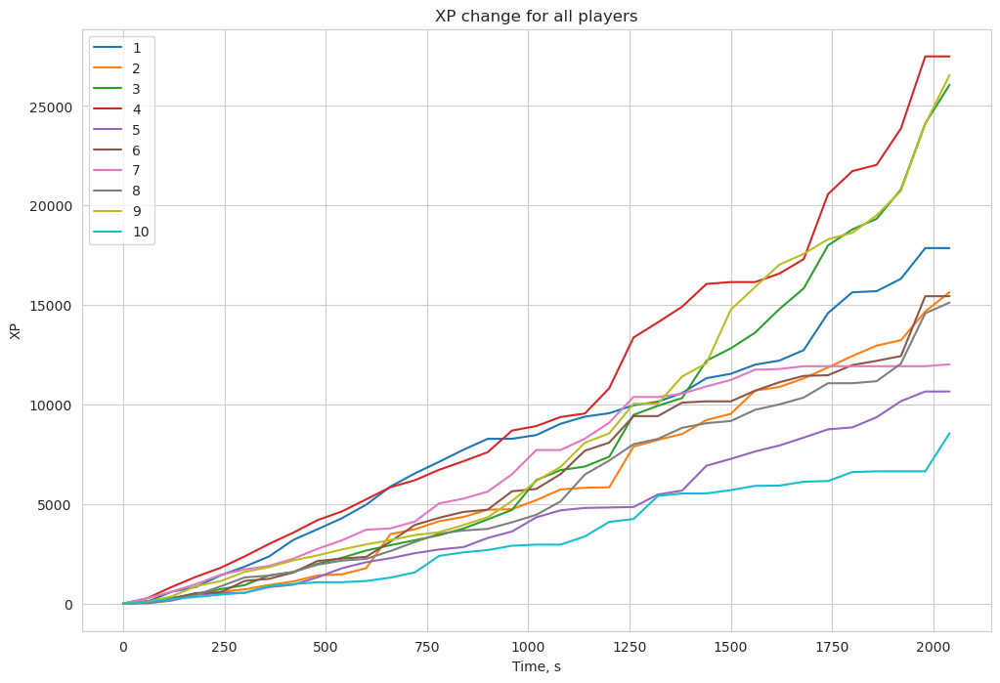

In [21]:
for i, player in enumerate(match["players"]):
    plt.plot(player["times"], player["xp_t"], label=str(i+1))

plt.legend()
plt.xlabel("Time, s")
plt.ylabel("XP")
plt.title("XP change for all players");

#### Сделаем чтение файла с сырыми данными и добавление новых признаков удобным

В этот раз для чтение `json` файлов лучше использовать библиотеку `ujson`, иначе все будет слишком долго :(

In [22]:
try:
    import ujson as json
except ModuleNotFoundError:
    import json
    print ("Подумайте об установке ujson, чтобы работать с JSON объектами быстрее")
    
try:
    from tqdm.notebook import tqdm
except ModuleNotFoundError:
    tqdm_notebook = lambda x: x
    print ("Подумайте об установке tqdm, чтобы следить за прогрессом")

    
def read_matches(matches_file, total_matches=31698, n_matches_to_read=None):
    """
    Аргуент
    -------
    matches_file: JSON файл с сырыми данными
    
    Результат
    ---------
    Возвращает записи о каждом матче
    """
    
    if n_matches_to_read is None:
        n_matches_to_read = total_matches
        
    c = 0
    with open(matches_file) as fin:
        for line in tqdm(fin, total=total_matches):
            if c >= n_matches_to_read:
                break
            else:
                c += 1
                yield json.loads(line)

#### Чтение данных в цикле

Чтение всех данных занимает 1-2 минуты, поэтому для начала можно попробовать следующее:

1. Читать 10-50 игр
2. Написать код для работы с этими JSON объектами
3. Убедиться, что все работает
4. Запустить код на всем датасете
5. Сохранить результат в `pickle` файл, чтобы в следующий раз не переделывать все заново

## <left>Feature engineering

Напишем функцию, которая поможет нам легче добавлять новые признаки.

In [23]:
def add_new_features(df_features, matches_file):
    """
    Аргуенты
    -------
    df_features: таблица с данными
    matches_file: JSON файл с сырыми данными
    
    Результат
    ---------
    Добавляет новые признаки в таблицу
    """
    
    for match in read_matches(matches_file):
        match_id_hash = match['match_id_hash']

        # Посчитаем количество разрушенных вышек обеими командами
        radiant_tower_kills = 0
        dire_tower_kills = 0
        for objective in match["objectives"]:
            if objective["type"] == "CHAT_MESSAGE_TOWER_KILL":
                if objective["team"] == 2:
                    radiant_tower_kills += 1
                if objective["team"] == 3:
                    dire_tower_kills += 1

        df_features.loc[match_id_hash, "radiant_tower_kills"] = radiant_tower_kills
        df_features.loc[match_id_hash, "dire_tower_kills"] = dire_tower_kills
        df_features.loc[match_id_hash, "diff_tower_kills"] = radiant_tower_kills - dire_tower_kills
        
        # ... (/¯◡ ‿ ◡)/¯☆*:・ﾟ добавляем новые признаки ...

In [24]:
# Скопируем таблицу с признаками
df_train_features_extended = df_train_features.copy()

# Добавим новые
add_new_features(df_train_features_extended, 
                 os.path.join(PATH_TO_DATA, 
                              "train_raw_data.jsonl"))

  0%|          | 0/31698 [00:00<?, ?it/s]

In [25]:
df_train_features_extended.head()

,game_time,game_mode,lobby_type,objectives_len,chat_len,r1_hero_id,r1_kills,r1_deaths,r1_assists,r1_denies,...,d5_rune_pickups,d5_firstblood_claimed,d5_teamfight_participation,d5_towers_killed,d5_roshans_killed,d5_obs_placed,d5_sen_placed,radiant_tower_kills,dire_tower_kills,diff_tower_kills
match_id_hash,,,,,,,,,,,,,,,,,,,,,
b9c57c450ce74a2af79c9ce96fac144d,658,4,0,3,10,15,7,2,0,7,...,0,0,0.00,0,0,0,0,2.0,0.0,2.0
6db558535151ea18ca70a6892197db41,21,23,0,0,0,101,0,0,0,0,...,0,0,0.00,0,0,0,0,0.0,0.0,0.0
19c39fe2af2b547e48708ca005c6ae74,160,22,7,0,0,57,0,0,0,1,...,0,0,0.00,0,0,0,0,0.0,0.0,0.0
c96d629dc0c39f0c616d1949938a6ba6,1016,22,0,1,0,119,0,3,3,5,...,3,0,0.25,0,0,3,0,0.0,0.0,0.0
156c88bff4e9c4668b0f53df3d870f1b,582,22,7,2,2,12,3,1,2,9,...,0,1,0.50,0,0,3,0,0.0,1.0,-1.0


In [26]:
%%time
cv_scores_base = cross_val_score(rf_model, X, y, cv=cv, scoring="roc_auc", n_jobs=-1)
cv_scores_extended = cross_val_score(rf_model, df_train_features_extended.values, y, 
                                     cv=cv, scoring="roc_auc", n_jobs=-1)

CPU times: user 60.3 ms, sys: 50.6 ms, total: 111 ms
Wall time: 28.7 s


In [27]:
print(f"ROC-AUC на кросс-валидации для базовых признаков: {cv_scores_base.mean()}")
print(f"ROC-AUC на кросс-валидации для новых признаков: {cv_scores_extended.mean()}")

ROC-AUC на кросс-валидации для базовых признаков: 0.7720210676055513
ROC-AUC на кросс-валидации для новых признаков: 0.778796825263235


Видно, что случайный лес стал работать немного лучше при добавлении новых признаков. A еще нужно, наверное, как-то по-умному закодировать категориальные признаки.

Дальше дело за малым. Добавляйте новые признаки, пробуйте другие методы, которые мы изучили, а также что-то интересное, что мы не прошли. Удачи!

## Dataset EDA

In [28]:
# let's get basic info
df_train_features.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31698 entries, b9c57c450ce74a2af79c9ce96fac144d to e2ca68ac1a6847f4a37f6c9c8ee8695b
Columns: 245 entries, game_time to d5_sen_placed
dtypes: float64(30), int64(215)
memory usage: 60.5+ MB


In [29]:
df_train_features.describe()

,game_time,game_mode,lobby_type,objectives_len,chat_len,r1_hero_id,r1_kills,r1_deaths,r1_assists,r1_denies,...,d5_stuns,d5_creeps_stacked,d5_camps_stacked,d5_rune_pickups,d5_firstblood_claimed,d5_teamfight_participation,d5_towers_killed,d5_roshans_killed,d5_obs_placed,d5_sen_placed
count,31698.000000,31698.000000,31698.000000,31698.000000,31698.000000,31698.000000,31698.000000,31698.000000,31698.000000,31698.000000,...,31698.000000,31698.000000,31698.000000,31698.000000,31698.000000,31698.000000,31698.000000,31698.000000,31698.000000,31698.000000
mean,1146.519496,19.583538,4.771563,6.535239,7.358982,51.081614,3.151713,3.273361,4.661998,6.255600,...,11.773022,1.021957,0.338381,4.697363,0.088965,0.416247,0.299640,0.024449,1.255568,0.780933
std,766.936655,6.306635,3.260899,6.486933,13.295763,34.573173,3.727116,3.281208,5.207887,8.144267,...,20.400131,3.427767,0.946140,4.662255,0.284697,0.267604,0.730835,0.172030,2.582681,2.436478
min,0.000000,2.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,-3.294393,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,521.000000,22.000000,0.000000,1.000000,0.000000,20.000000,0.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,1.000000,0.000000,0.235294,0.000000,0.000000,0.000000,0.000000
50%,1044.000000,22.000000,7.000000,4.000000,3.000000,44.000000,2.000000,2.000000,3.000000,3.000000,...,1.532971,0.000000,0.000000,3.000000,0.000000,0.444444,0.000000,0.000000,0.000000,0.000000
75%,1659.000000,22.000000,7.000000,10.000000,9.000000,81.000000,5.000000,5.000000,7.000000,9.000000,...,16.129388,0.000000,0.000000,7.000000,0.000000,0.600000,0.000000,0.000000,1.000000,0.000000
max,4933.000000,23.000000,7.000000,43.000000,291.000000,120.000000,32.000000,27.000000,40.000000,83.000000,...,222.612630,107.000000,29.000000,57.000000,1.000000,2.000000,9.000000,5.000000,26.000000,47.000000


In [30]:
# checking for Nan in dataset
df_train_features.isnull().sum().sum()

0

To visualize some features, I merged train features dataset with its targets.

In [31]:
df = df_train_features.merge(df_train_targets["radiant_win"], on='match_id_hash')

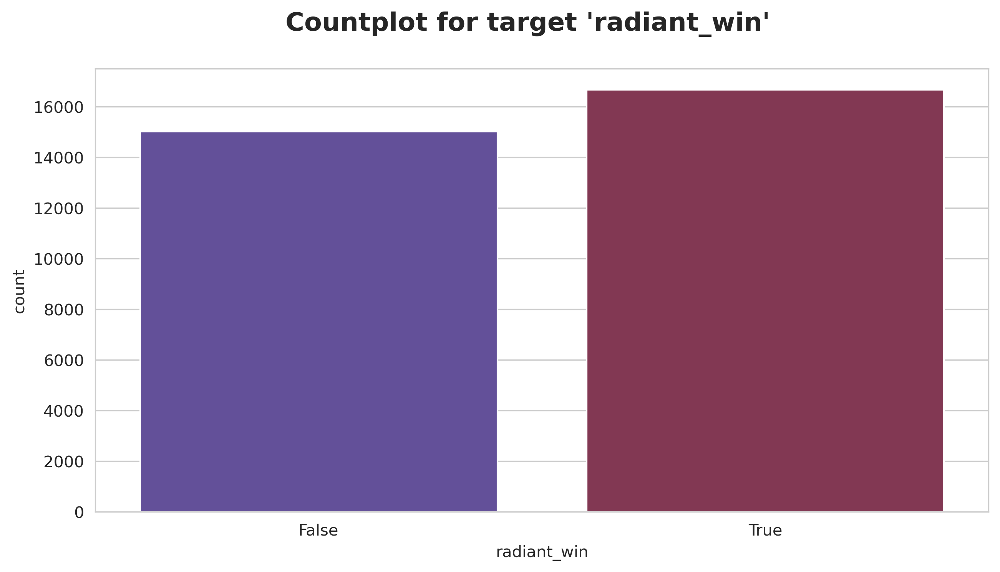

In [32]:
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
sns.countplot(df["radiant_win"], palette="twilight", ax=ax)
fig.suptitle("Countplot for target 'radiant_win'", fontweight='bold', fontsize=16);

Pretty balanced targets, really good. Features "game_time", "game_mode", "lobby_type", "objectives_len" seem for me not important. I decided to visualize them for both classes.

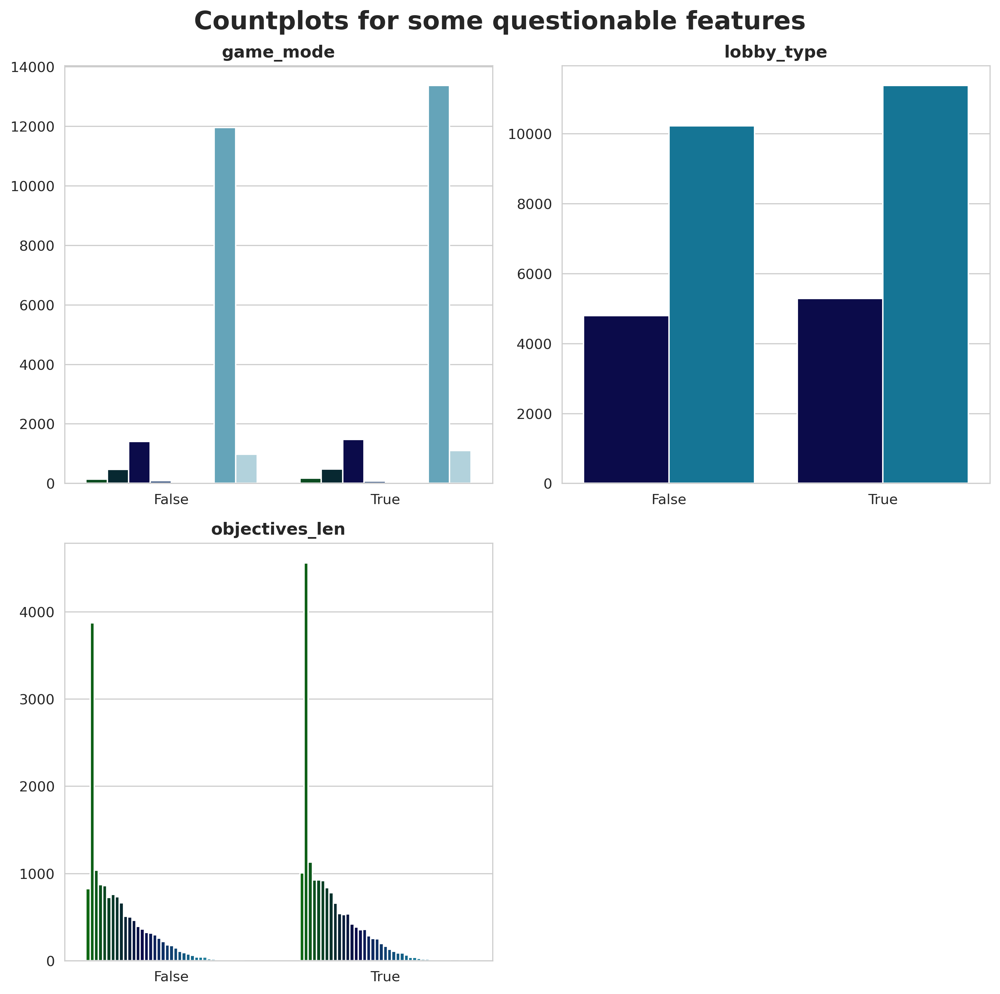

In [33]:
que_features = ["game_mode", "lobby_type", "objectives_len"]
fig, axes = plt.subplots(ncols=2, nrows=2, figsize=(10,10), dpi=300)
for i, feat in enumerate(que_features):
    sns.countplot(df['radiant_win'], hue=df[feat], ax=axes.flat[i], palette='ocean')
    axes.flat[i].set(xlabel='', ylabel='')
    axes.flat[i].set_title(feat, fontsize=12, fontweight='bold')
    axes.flat[i].legend([],[], frameon=False)
fig.suptitle("Countplots for some questionable features", fontsize=18, fontweight="bold")
plt.delaxes(ax=axes.flat[3])
plt.tight_layout()
plt.show();

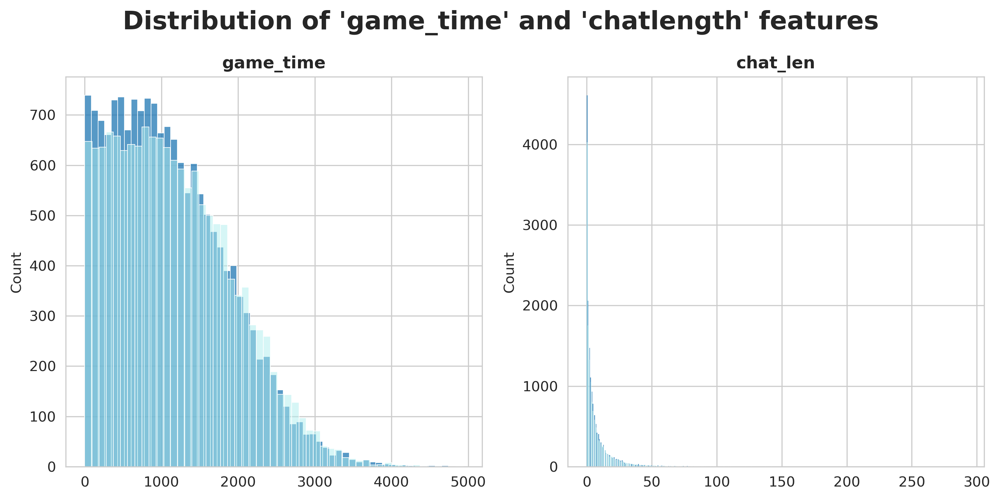

In [34]:
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(10,5), dpi=300)
for i, feat in enumerate(["game_time", "chat_len"]):
    sns.histplot(df[df["radiant_win"] == True][feat], ax=axes.flat[i], palette="seagreen")
    sns.histplot(df[df["radiant_win"] == False][feat], ax=axes.flat[i], color="paleturquoise", alpha=0.5)
    axes.flat[i].set(xlabel='')
    axes.flat[i].set_title(feat, fontsize=12, fontweight='bold')
    axes.flat[i].legend([],[], frameon=False)
fig.suptitle("Distribution of 'game_time' and 'chatlength' features", fontsize=18, fontweight="bold")
plt.tight_layout();

So, distribution and couts for this features are almost the same for target classes. I will decide their fates further:)

Also, I tried to visualize heroes on the Dota2 map. Here the results.

In [35]:
coord_columns = [coord.endswith("_x") or coord.endswith("_y") for coord in df_train_features.columns]
coords_df = df_train_features[df_train_features.columns[coord_columns]]
coords_df

,r1_x,r1_y,r2_x,r2_y,r3_x,r3_y,r4_x,r4_y,r5_x,r5_y,d1_x,d1_y,d2_x,d2_y,d3_x,d3_y,d4_x,d4_y,d5_x,d5_y
match_id_hash,,,,,,,,,,,,,,,,,,,,
b9c57c450ce74a2af79c9ce96fac144d,76,78,78,166,156,146,154,148,150,148,88,170,156,98,124,144,124,142,180,176
6db558535151ea18ca70a6892197db41,118,118,156,104,78,144,150,78,78,142,180,178,100,174,178,112,176,110,162,162
19c39fe2af2b547e48708ca005c6ae74,92,148,116,120,184,96,80,164,78,164,94,172,86,172,130,130,184,100,182,174
c96d629dc0c39f0c616d1949938a6ba6,112,112,124,110,174,88,116,120,84,138,128,126,174,110,84,156,136,154,92,172
156c88bff4e9c4668b0f53df3d870f1b,120,118,78,128,122,116,170,86,114,78,158,112,132,134,124,126,176,90,126,126
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
b794aa55646841a03c7783226e6f6bc8,152,148,92,88,86,86,158,144,104,78,74,94,78,102,76,100,80,100,78,100
308faee28efee2e66b39f9f2ba6ea9cf,132,136,138,136,132,134,160,114,142,138,158,156,154,148,172,86,150,146,182,176
6066cc7417b43c749d551e123d00f0c8,152,92,168,82,76,144,126,140,78,148,92,154,126,134,128,128,96,166,116,140


In [36]:
r1_coords = list(zip(coords_df["r1_x"], coords_df["r1_y"]))
d1_coords = list(zip(coords_df["d1_x"], coords_df["d1_y"]))

In [37]:
throns = [(80, 85), (170.5, 166.5)]

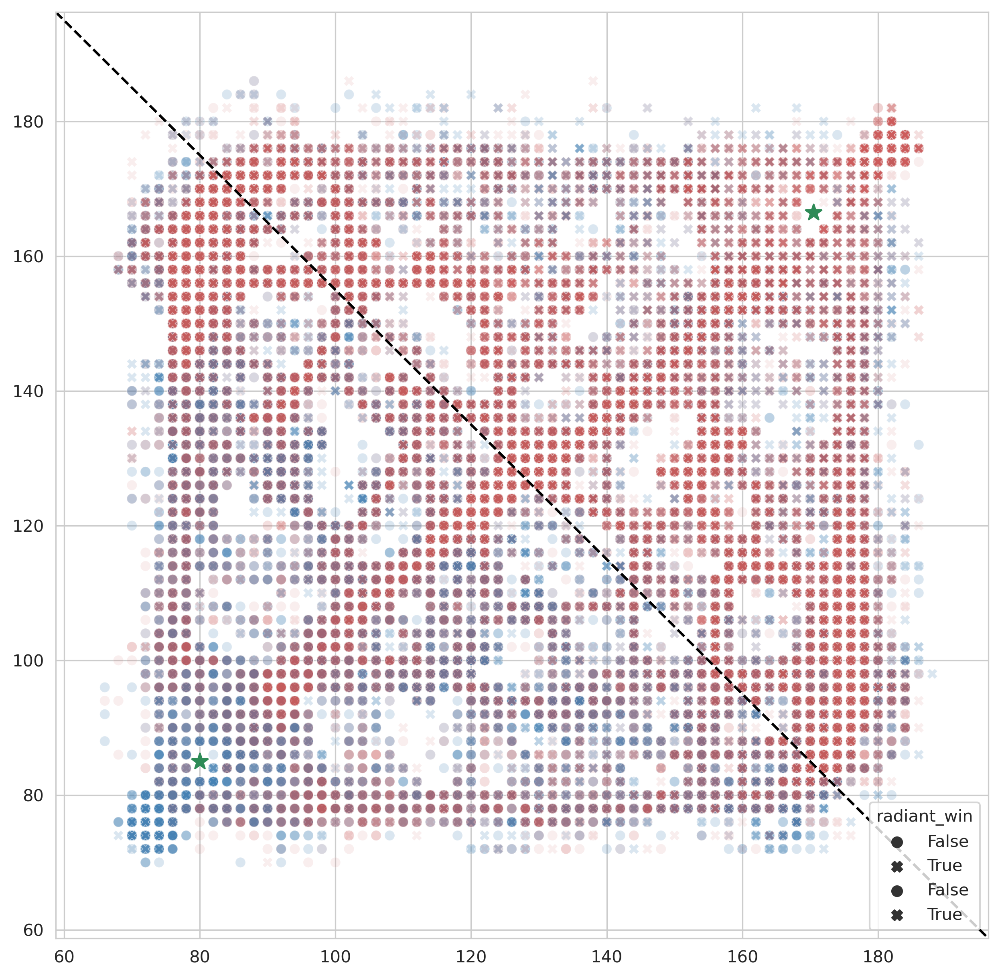

In [38]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=300)
sns.scatterplot(*zip(*r1_coords), alpha=0.2, color="steelblue", style=df["radiant_win"], ax=ax)
sns.scatterplot(*zip(*d1_coords), alpha=0.1, color="indianred", style=df["radiant_win"], ax=ax)
ax.scatter(*zip(*throns), s=100, c="seagreen", marker="*")
ax.axline(xy1=(65,190), xy2=(190, 65), color='black', linestyle='--');
# ax.axline(xy1=(65,70), xy2=(190,185), color='black', linestyle='--');

The blach dashed diagonal is the river and green stars are throns:) It is beautiful, I was hoping very much for a feature that could be compiled from the position of the heroes on the map, but this feature did not have much weight in the end for my model. Disappointing.

## Building base models for initial train dataset

I decided to work with following base models.

In [39]:
rf_model = RandomForestClassifier(n_estimators=300, max_depth=7, n_jobs=-1, random_state=SEED)
xgb = xgboost.XGBClassifier(random_state=SEED, verbosity = 0)
xgb_rf = xgboost.XGBRFClassifier(random_state=SEED)
lgbm = lightgbm.LGBMClassifier(random_state=SEED)
lgbm_rf = lightgbm.LGBMClassifier(boosting_type="rf", bagging_freq=1, bagging_fraction=0.7, random_state=SEED)
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
lr = LogisticRegression(solver='liblinear', max_iter=10000)

base_models = [("XGB", xgb), ("XGB_RF", xgb_rf), ("LGBM", lgbm), 
               ("LGBM_RF", lgbm_rf), ("CAT", cat), ("rf", rf_model), ("LogR", lr)]
metrics = [accuracy_score, precision_score, recall_score, f1_score, roc_auc_score]

In [40]:
def build_base_models(base_models, X_train, X_test, y_train, y_test):
    for i, model in enumerate(base_models):
        pipeline = make_pipeline(model[1])
        pipeline.fit(X_train, y_train)
        scores = cross_val_score(pipeline, X_train, y_train, cv=cv, scoring="roc_auc")
        print(f'\n{model[1].__class__.__name__} cross val roc_auc-score: {scores.mean()}')

        y_pred = pipeline.predict(X_test)
        y_score = pipeline.predict_proba(X_test)

        for metric in metrics:
            print(f'{metric.__name__}: {metric(y_test, y_pred)}')
            # if accuracy_score:
            #     print(f'{metric.__name__}: {metric(y_test, y_pred)}')
            # else:
            #     print(f'{metric.__name__}: {metric(y_test, y_pred, average="macro")}')

        print(classification_report(y_test, y_pred))

        conf_mat = confusion_matrix(y_true=y_test, y_pred=y_pred, labels=pipeline[0].classes_)    
        axes1.flat[i].set_title(f'Confusion matrix for {model[1].__class__.__name__}', fontsize=10, fontweight='bold')
        ConfusionMatrixDisplay(conf_mat, display_labels=pipeline[0].classes_).plot(ax = axes1.flat[i], cmap="summer")


        axes2.flat[i].set_title(f'ROC curve for {model[1].__class__.__name__}', size=10, weight='bold')
        RocCurveDisplay.from_estimator(pipeline, X_test, y_test, color="#1a0", ax=axes2.flat[i])
        axes2.flat[i].plot([0, 1], color='b', linestyle=(0, (3, 10, 1, 10)))


XGBClassifier cross val roc_auc-score: 0.7755502893712902
accuracy_score: 0.6944269190325972
precision_score: 0.7012663085188028
recall_score: 0.7304156674660272
f1_score: 0.7155442443226312
roc_auc_score: 0.6924381932536527
              precision    recall  f1-score   support

           0       0.69      0.65      0.67      4506
           1       0.70      0.73      0.72      5004

    accuracy                           0.69      9510
   macro avg       0.69      0.69      0.69      9510
weighted avg       0.69      0.69      0.69      9510


XGBRFClassifier cross val roc_auc-score: 0.7561178033285174
accuracy_score: 0.6811777076761304
precision_score: 0.6579621916052547
recall_score: 0.8207434052757794
f1_score: 0.7303930286324025
roc_auc_score: 0.6734653555451244
              precision    recall  f1-score   support

           0       0.73      0.53      0.61      4506
           1       0.66      0.82      0.73      5004

    accuracy                           0.68      9510
 

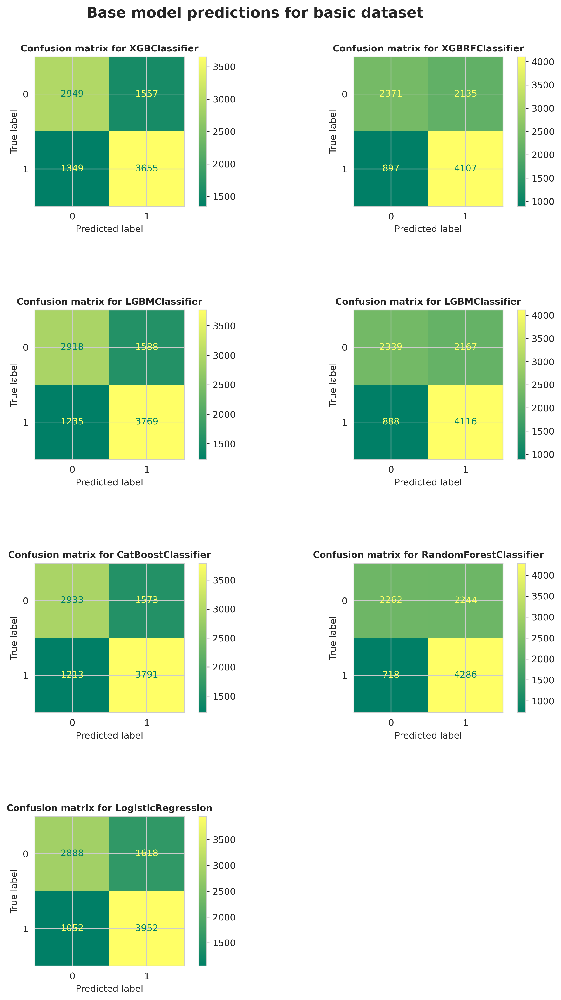

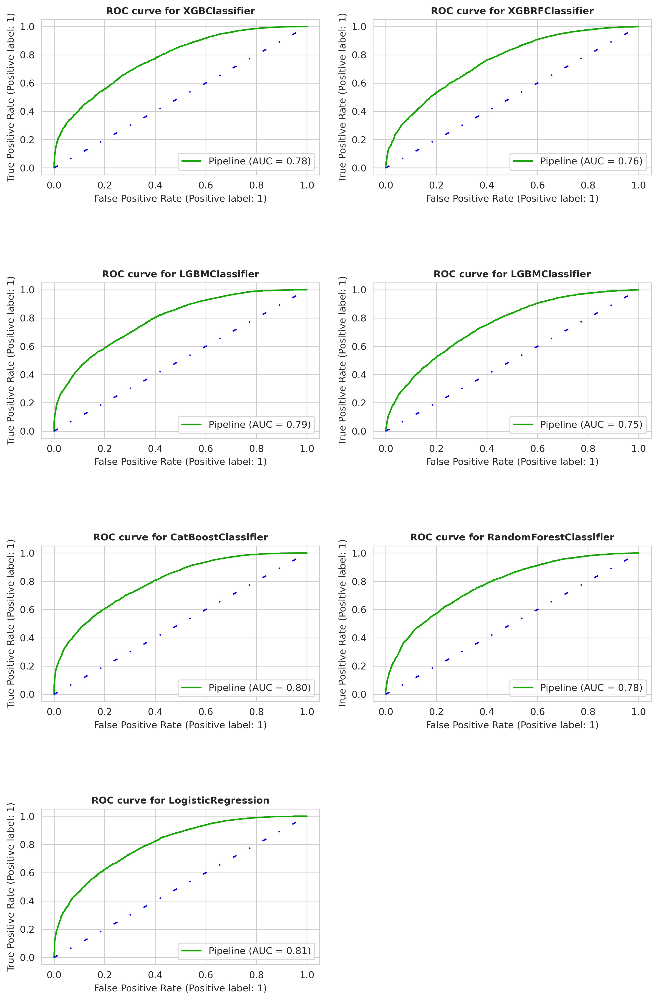

In [61]:
# for basic dataset
fig1, axes1 = plt.subplots(ncols=2, nrows=4, figsize=(10, 15), dpi=300)
fig2, axes2 = plt.subplots(ncols=2, nrows=4, figsize=(10, 15), dpi=300)

X = df_train_features.values
y = df_train_targets["radiant_win"].values.astype("int8")
X_train, X_valid, y_train, y_valid = train_test_split(X, y, 
                                                      test_size=0.3, 
                                                      random_state=SEED)

build_base_models(base_models, X_train, X_valid, y_train, y_valid)

fig1.delaxes(axes1[3][1])
fig2.delaxes(axes2[3][1])
fig1.tight_layout(pad=2, w_pad=2, h_pad=7)
fig2.tight_layout(pad=2, w_pad=2, h_pad=7)
fig1.suptitle("Base model predictions for basic dataset", fontsize=16, fontweight='bold', y=1.02)
plt.show();

Also, I tried to use `VotingClassifier` for different base models. I am lazy to wait for all possible combinations and blablabla. I do not know, why I saved only this vote in my notebook:D

In [90]:
base_models = [("LogR", lr), (("CAT", cat))]
voting_hard = VotingClassifier(estimators = base_models, voting="hard")
voting_soft = VotingClassifier(estimators = base_models, voting="soft")

# basic dataset
X = df_train_features.values
y = df_train_targets["radiant_win"].values.astype("int8")
X_train, X_valid, y_train, y_valid = train_test_split(X, y, 
                                                      test_size=0.3,
                                                      stratify=y,
                                                      random_state=SEED)
    
scores_dict = {'model': [], 'roc_auc':[]}
for model in [cat, lr, voting_hard, voting_soft]:
    scores_dict['model'].append(model.__class__.__name__)
    scores = cross_val_score(model, X_train, y_train, cv=cv, scoring="roc_auc")
    scores_dict['roc_auc'].append(scores.mean());

In [91]:
scores_df = pd.DataFrame(scores_dict)
scores_df.sort_values(by="roc_auc", ascending=False, inplace=True)
scores_df.reset_index(drop=True, inplace=True)
scores_df

,model,roc_auc
0,VotingClassifier,0.806185
1,LogisticRegression,0.803642
2,CatBoostClassifier,0.793160
3,VotingClassifier,NaN


## Feature Engineering

In [41]:
# dataset for my experiments with json file
df_train_features_raw = df_train_features.iloc[:,:5]
df_train_features_raw.head()

,game_time,game_mode,lobby_type,objectives_len,chat_len
match_id_hash,,,,,
b9c57c450ce74a2af79c9ce96fac144d,658,4,0,3,10
6db558535151ea18ca70a6892197db41,21,23,0,0,0
19c39fe2af2b547e48708ca005c6ae74,160,22,7,0,0
c96d629dc0c39f0c616d1949938a6ba6,1016,22,0,1,0
156c88bff4e9c4668b0f53df3d870f1b,582,22,7,2,2


Let's begin with basic features in `train_data.csv`. For them, I calculated command statistics (sum, diff, ratio). Firstly, I prepared subset with stats for Radiant and Dire heroes.

In [42]:
df_heroes_columns = [col.startswith("r") or col.startswith("d") for col in df_train_features.columns]
df_heroes = df_train_features[df_train_features.columns[df_heroes_columns]]
df_heroes.drop(df_heroes.columns[[col.endswith("_x") or col.endswith("_y") for col in df_heroes.columns]], 
               axis=1, inplace=True)
df_heroes.head()

,r1_hero_id,r1_kills,r1_deaths,r1_assists,r1_denies,r1_gold,r1_lh,r1_xp,r1_health,r1_max_health,...,d5_stuns,d5_creeps_stacked,d5_camps_stacked,d5_rune_pickups,d5_firstblood_claimed,d5_teamfight_participation,d5_towers_killed,d5_roshans_killed,d5_obs_placed,d5_sen_placed
match_id_hash,,,,,,,,,,,,,,,,,,,,,
b9c57c450ce74a2af79c9ce96fac144d,15,7,2,0,7,5257,52,3937,1160,1160,...,0.000000,0,0,0,0,0.00,0,0,0,0
6db558535151ea18ca70a6892197db41,101,0,0,0,0,176,0,0,680,680,...,0.000000,0,0,0,0,0.00,0,0,0,0
19c39fe2af2b547e48708ca005c6ae74,57,0,0,0,1,403,0,359,740,740,...,0.000000,0,0,0,0,0.00,0,0,0,0
c96d629dc0c39f0c616d1949938a6ba6,119,0,3,3,5,3085,1,2828,495,740,...,8.264696,0,0,3,0,0.25,0,0,3,0
156c88bff4e9c4668b0f53df3d870f1b,12,3,1,2,9,3516,40,3964,495,960,...,15.762911,3,1,0,1,0.50,0,0,3,0


In [43]:
# for calculating command stats
def calc_command_stats(df):
    hero_stats = df.columns[[i.startswith("r1") for i in df.columns]]
    hero_stats = [i[3:] for i in hero_stats]
    heroes_columns = df.columns[[i.endswith("_hero_id") for i in df.columns]]
    command_stats = df[heroes_columns]
    for stat in hero_stats:
        if not stat.endswith("id"):
            command_stats[f"r_{stat}_sum"] = df[[f"r{i}_{stat}" for i in range(1,6)]].sum(axis=1)
            command_stats[f"d_{stat}_sum"] = df[[f"d{i}_{stat}" for i in range(1,6)]].sum(axis=1)
            command_stats[f"{stat}_diff"] = command_stats[f"r_{stat}_sum"] - command_stats[f"d_{stat}_sum"]
            command_stats[f"{stat}_ratio"] = command_stats[f"r_{stat}_sum"] / command_stats[f"d_{stat}_sum"]
    return command_stats

In [44]:
command_stats= calc_command_stats(df_heroes)
command_stats.replace(np.nan, 0.0001, inplace=True)
command_stats.head()

,r1_hero_id,r2_hero_id,r3_hero_id,r4_hero_id,r5_hero_id,d1_hero_id,d2_hero_id,d3_hero_id,d4_hero_id,d5_hero_id,...,roshans_killed_diff,roshans_killed_ratio,r_obs_placed_sum,d_obs_placed_sum,obs_placed_diff,obs_placed_ratio,r_sen_placed_sum,d_sen_placed_sum,sen_placed_diff,sen_placed_ratio
match_id_hash,,,,,,,,,,,,,,,,,,,,,
b9c57c450ce74a2af79c9ce96fac144d,15,96,27,63,89,58,14,1,56,92,...,0,0.0001,4,5,-1,0.800000,3,2,1,1.5000
6db558535151ea18ca70a6892197db41,101,51,44,49,53,18,67,47,40,17,...,0,0.0001,0,0,0,0.000100,0,0,0,0.0001
19c39fe2af2b547e48708ca005c6ae74,57,10,81,98,119,48,68,60,102,8,...,0,0.0001,1,0,1,inf,0,0,0,0.0001
c96d629dc0c39f0c616d1949938a6ba6,119,71,44,35,108,47,98,26,104,90,...,0,0.0001,6,7,-1,0.857143,2,1,1,2.0000
156c88bff4e9c4668b0f53df3d870f1b,12,49,91,114,50,51,47,48,119,68,...,0,0.0001,2,4,-2,0.500000,0,1,-1,0.0000


Secondly, for the heroes, I decided to calculate their win rate.

In [45]:
df_heroes_ids = pd.concat([command_stats.iloc[:, [i.endswith("_hero_id") for i in command_stats.columns]],
                           df_train_targets['radiant_win']], axis=1)
win_rate = df_heroes_ids.melt('radiant_win', ignore_index=True,
                              value_vars=df_heroes_ids.columns[[i.endswith("_hero_id") for i in df_heroes_ids.columns]])

In [46]:
win_rate.head()

,radiant_win,variable,value
0,True,r1_hero_id,15
1,True,r1_hero_id,101
2,False,r1_hero_id,57
3,True,r1_hero_id,119
4,False,r1_hero_id,12


In [47]:
hero_counts = dict(win_rate.value.value_counts())

In [48]:
radiant_winrate = dict(win_rate[(win_rate['variable'].isin([f'r{i+1}_hero_id' for i in range(5)])) 
                                 & (win_rate['radiant_win'] == 1)].value.value_counts())

In [49]:
dire_winrate = dict(win_rate[(win_rate['variable'].isin([f'd{i+1}_hero_id' for i in range(5)])) 
                             & (win_rate['radiant_win'] == 0)].value.value_counts())

In [50]:
total_wins = {}
for key, value in dire_winrate.items():
    for key1, value1 in radiant_winrate.items():
        if key1 == key:
            total_wins[key] = value + value1

In [51]:
win_percent = {}
for key, value in hero_counts.items():
    for key1, value1 in total_wins.items():
        if key1 == key:
            win_percent[key] = value1 / value

In [52]:
for col in df_heroes_ids.columns[:-1]:
    rates = []
    for ids in df_heroes_ids[col]:
        rates.append(win_percent[ids])
    df_heroes_ids[f'{col[:-2]}winrate'] = rates

In [53]:
df_heroes_ids.head()

,r1_hero_id,r2_hero_id,r3_hero_id,r4_hero_id,r5_hero_id,d1_hero_id,d2_hero_id,d3_hero_id,d4_hero_id,d5_hero_id,...,r1_hero_winrate,r2_hero_winrate,r3_hero_winrate,r4_hero_winrate,r5_hero_winrate,d1_hero_winrate,d2_hero_winrate,d3_hero_winrate,d4_hero_winrate,d5_hero_winrate
match_id_hash,,,,,,,,,,,,,,,,,,,,,
b9c57c450ce74a2af79c9ce96fac144d,15,96,27,63,89,58,14,1,56,92,...,0.479358,0.545319,0.528971,0.503371,0.474359,0.473636,0.504202,0.472848,0.536993,0.602058
6db558535151ea18ca70a6892197db41,101,51,44,49,53,18,67,47,40,17,...,0.522029,0.527214,0.491272,0.518550,0.445614,0.507140,0.577586,0.515546,0.489277,0.497717
19c39fe2af2b547e48708ca005c6ae74,57,10,81,98,119,48,68,60,102,8,...,0.532962,0.466926,0.541269,0.447745,0.503966,0.521183,0.532309,0.497850,0.552333,0.521045
c96d629dc0c39f0c616d1949938a6ba6,119,71,44,35,108,47,98,26,104,90,...,0.503966,0.517799,0.491272,0.497302,0.550531,0.515546,0.447745,0.488838,0.478618,0.467043
156c88bff4e9c4668b0f53df3d870f1b,12,49,91,114,50,51,47,48,119,68,...,0.505334,0.518550,0.400759,0.483508,0.485303,0.527214,0.515546,0.521183,0.503966,0.532309


Thirdly, I transfomed heroes coordinates into a presence on their own half of the map or on the opponent's side. I used -1 if the hero in home part of the map, 0 if in the neutral riveside, or 1 for the presence in opponent's side.

In [54]:
def determine_place(x, y):
    w = 5
    if 190 - (x + y) >= w:
        return -1
    elif 190 - (x + y) <= -w:
        return 1
    else:
        return 0


for i in range(1, len(coords_df.columns), 2):
    if coords_df.columns[i-1].startswith('r'):
        coords_df[f'{coords_df.columns[i-1][:2]}_place'] = coords_df.apply(lambda row: determine_place(row[i-1], row[i]), axis=1)
    else:
        coords_df[f'{coords_df.columns[i-1][:2]}_place'] = - coords_df.apply(lambda row: determine_place(row[i-1], row[i]), axis=1)
    # coords_df[f'{coords_df.columns[i-1][:2]}_place'] = coords_df.apply(lambda row: determine_place(row[i-1], row[i]), axis=1)
        
coords_df[f"r_place_sum"] = coords_df[[f"r{i}_place" for i in range(1,6)]].sum(axis=1)
coords_df[f"d_place_sum"] = coords_df[[f"d{i}_place" for i in range(1,6)]].sum(axis=1)
coords_df["place_diff"] = coords_df[f"r_place_sum"] - coords_df[f"d_place_sum"]
coords_df["place_ratio"] = coords_df[f"r_place_sum"] / coords_df[f"d_place_sum"]    

In [55]:
coords_df.head()

,r1_x,r1_y,r2_x,r2_y,r3_x,r3_y,r4_x,r4_y,r5_x,r5_y,...,r5_place,d1_place,d2_place,d3_place,d4_place,d5_place,r_place_sum,d_place_sum,place_diff,place_ratio
match_id_hash,,,,,,,,,,,,,,,,,,,,,
b9c57c450ce74a2af79c9ce96fac144d,76,78,78,166,156,146,154,148,150,148,...,1,-1,-1,-1,-1,-1,3,-5,8,-0.6
6db558535151ea18ca70a6892197db41,118,118,156,104,78,144,150,78,78,142,...,1,-1,-1,-1,-1,-1,5,-5,10,-1.0
19c39fe2af2b547e48708ca005c6ae74,92,148,116,120,184,96,80,164,78,164,...,1,-1,-1,-1,-1,-1,5,-5,10,-1.0
c96d629dc0c39f0c616d1949938a6ba6,112,112,124,110,174,88,116,120,84,138,...,1,-1,-1,-1,-1,-1,5,-5,10,-1.0
156c88bff4e9c4668b0f53df3d870f1b,120,118,78,128,122,116,170,86,114,78,...,0,-1,-1,-1,-1,-1,4,-5,9,-0.8


Forthly, I built some features according to data in `train_raw_data.jsonl` file. I can't say that I fully understand the meaning of some of these features, but using them, the model turns out to be quite good. Further, I mixed and tried to drop a lot of this features. Of course, I didn't save all the combinations here.

In [93]:
def add_new_features(df_features, matches_file):
    """
    Аргументы
    -------
    df_features: таблица с данными
    matches_file: JSON файл с сырыми данными
    
    Результат
    ---------
    Добавляет новые признаки в таблицу
    """
    
    for match in read_matches(matches_file, df_features.shape[0]):
        match_id_hash = match['match_id_hash']
        
        r_kda_sum = 0
        r_pred_vict_pl = 0
        r_max_hero_hit_sum = 0
        r_ability_level_sum = 0
        d_kda_sum = 0
        d_pred_vict_pl = 0
        d_max_hero_hit_sum = 0
        d_ability_level_sum = 0
        r_inventory_sum = 0
        d_inventory_sum = 0
        r_purchases_sum = 0
        d_purchases_sum = 0
        
        for i in range(10):
            if i < 5:
                player = match["players"][i]
                r_kda_sum += (player["kills"] + player["assists"]) / (player["deaths"] if player["deaths"] != 0 else 0.001)
                r_max_hero_hit_sum += player['max_hero_hit']['value']
                r_inventory_sum += len(player["hero_inventory"])
                r_purchases_sum += len(player["purchase"])
                if player['pred_vict']:
                    r_pred_vict_pl = 1
                if player['ability_upgrades']:
                    r_ability_level_sum += player['ability_upgrades'][-1]['level']
            else:
                player = match["players"][i]
                d_kda_sum += (player["kills"] + player["assists"]) / (player["deaths"] if player["deaths"] != 0 else 0.001)
                d_max_hero_hit_sum += player['max_hero_hit']['value']
                d_inventory_sum += len(player["hero_inventory"])
                d_purchases_sum += len(player["purchase"])
                if player['pred_vict']:
                    d_pred_vict_pl = 1
                if player['ability_upgrades']:    
                    d_ability_level_sum += player['ability_upgrades'][-1]['level']

        df_features.loc[match_id_hash, "r_kda_sum"] = r_kda_sum
        df_features.loc[match_id_hash, "d_kda_sum"] = d_kda_sum
        df_features.loc[match_id_hash, "kda_sum_diff"] = r_kda_sum - d_kda_sum
        df_features.loc[match_id_hash, "r_pred_vict_pl"] = r_pred_vict_pl
        df_features.loc[match_id_hash, "d_pred_vict_pl"] = d_pred_vict_pl
        df_features.loc[match_id_hash, "r_ability_level_sum"] = r_ability_level_sum
        df_features.loc[match_id_hash, "d_ability_level_sum"] = d_ability_level_sum
        df_features.loc[match_id_hash, "ability_level_sum_diff"] = r_ability_level_sum - d_ability_level_sum
        df_features.loc[match_id_hash, "r_max_hero_hit_sum"] = r_max_hero_hit_sum
        df_features.loc[match_id_hash, "d_max_hero_hit_sum"] = d_max_hero_hit_sum
        df_features.loc[match_id_hash, "max_hero_hit_sum_diff"] = r_max_hero_hit_sum - d_max_hero_hit_sum
        df_features.loc[match_id_hash, "r_inventory_sum"] = r_inventory_sum
        df_features.loc[match_id_hash, "d_inventory_sum"] = d_inventory_sum
        df_features.loc[match_id_hash, "inventory_diff"] = r_inventory_sum - d_inventory_sum
        df_features.loc[match_id_hash, "r_purchases_sum"] = r_purchases_sum
        df_features.loc[match_id_hash, "d_purchases_sum"] = d_purchases_sum
        df_features.loc[match_id_hash, "purchases_diff"] = r_purchases_sum - d_purchases_sum
        
        r_firstbood = 0
        r_aegis = 0
        r_aegis_stolen = 0
        r_tower_kills = 0
        r_roshan_kills = 0
        r_baracks_kills = 0
        
        d_aegis = 0
        d_aegis_stolen = 0
        d_tower_kills = 0
        d_roshan_kills = 0
        d_baracks_kills = 0              
        
        for objective in match["objectives"]:
            if objective['type'] == 'CHAT_MESSAGE_FIRSTBLOOD':
                if objective['player_slot'] in [0, 1, 2, 3, 4]:
                    r_firstbood = 1
                    
            if objective['type'] == 'CHAT_MESSAGE_AEGIS':
                if objective['player_slot'] in [0, 1, 2, 3, 4]:
                    r_aegis += 1
                if objective['player_slot'] in [128, 129, 130, 131, 132]:
                    d_aegis += 1
                    
            if objective['type'] == 'CHAT_MESSAGE_AEGIS_STOLEN':
                if objective['player_slot'] in [0, 1, 2, 3, 4]:
                    r_aegis_stolen += 1
                if objective['player_slot'] in [128, 129, 130, 131, 132]:
                    d_aegis_stolen += 1
                    
            if objective["type"] == "CHAT_MESSAGE_TOWER_KILL":
                if objective["team"] == 2:
                    r_tower_kills += 1
                if objective["team"] == 3:
                    d_tower_kills += 1        
                    
            if objective["type"] == "CHAT_MESSAGE_ROSHAN_KILL":
                if objective["team"] == 2:
                    r_roshan_kills += 1
                if objective["team"] == 3:
                    d_roshan_kills += 1
                    
            if objective['type'] == 'CHAT_MESSAGE_BARRACKS_KILL': 
                if objective['key'] in ['1','2','4','8','16','32']:
                    r_baracks_kills += 1
                if objective['key'] in ['64','128','256','512','1024','2048']:
                    d_baracks_kills += 1
                    
        df_features.loc[match_id_hash, "r_firstbood"] = r_firstbood
        df_features.loc[match_id_hash, "r_aegis"] = r_aegis
        df_features.loc[match_id_hash, "d_aegis"] = d_aegis
        df_features.loc[match_id_hash, "aegis_diff"] = r_aegis - d_aegis
        df_features.loc[match_id_hash, "r_aegis_stolen"] = r_aegis_stolen
        df_features.loc[match_id_hash, "d_aegis_stolen"] = d_aegis_stolen
        df_features.loc[match_id_hash, "aegis_stolen_diff"] = r_aegis_stolen - d_aegis_stolen
        df_features.loc[match_id_hash, "r_tower_kills"] = r_tower_kills
        df_features.loc[match_id_hash, "d_tower_kills"] = d_tower_kills
        df_features.loc[match_id_hash, "tower_kills_diff"] = r_tower_kills - d_tower_kills
        df_features.loc[match_id_hash, "r_roshan_kills"] = r_roshan_kills
        df_features.loc[match_id_hash, "d_roshan_kills"] = d_roshan_kills
        df_features.loc[match_id_hash, "roshan_kills_diff"] = r_roshan_kills - d_roshan_kills
        df_features.loc[match_id_hash, "r_baracks_kills"] = r_baracks_kills
        df_features.loc[match_id_hash, "d_baracks_kills"] = d_baracks_kills
        df_features.loc[match_id_hash, "baracks_kills_diff"] = r_baracks_kills - d_baracks_kills

In [94]:
add_new_features(df_train_features_raw, os.path.join(PATH_TO_DATA, 
                                                     "train_raw_data.jsonl"))

  0%|          | 0/31698 [00:00<?, ?it/s]

In [95]:
df_train_features_raw.to_csv("train_features_extended.csv")
print(df_train_features_raw.shape)
df_train_features_raw.head()

(31698, 38)


,game_time,game_mode,lobby_type,objectives_len,chat_len,r_kda_sum,d_kda_sum,kda_sum_diff,r_pred_vict_pl,d_pred_vict_pl,...,aegis_stolen_diff,r_tower_kills,d_tower_kills,tower_kills_diff,r_roshan_kills,d_roshan_kills,roshan_kills_diff,r_baracks_kills,d_baracks_kills,baracks_kills_diff
match_id_hash,,,,,,,,,,,,,,,,,,,,,
b9c57c450ce74a2af79c9ce96fac144d,658,4,0,3,10,13013.5,2.0,13011.5,0.0,0.0,...,0.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0
6db558535151ea18ca70a6892197db41,21,23,0,0,0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
19c39fe2af2b547e48708ca005c6ae74,160,22,7,0,0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
c96d629dc0c39f0c616d1949938a6ba6,1016,22,0,1,0,10.6,4009.5,-3998.9,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
156c88bff4e9c4668b0f53df3d870f1b,582,22,7,2,2,10.5,5011.5,-5001.0,1.0,1.0,...,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0


### Preparing test dataset

In [113]:
# dataset for my experiments with json file
df_test_features_raw = df_test_features.iloc[:,:5]
df_test_features_raw.head()

,game_time,game_mode,lobby_type,objectives_len,chat_len
match_id_hash,,,,,
a400b8f29dece5f4d266f49f1ae2e98a,155,22,7,1,11
46a0ddce8f7ed2a8d9bd5edcbb925682,576,22,7,1,4
b1b35ff97723d9b7ade1c9c3cf48f770,453,22,7,1,3
ab3cc6ccac661a1385e73a2e9f21313a,721,4,0,2,1
54aaab1cb8cc5df3c253641618673266,752,22,7,1,0


In [114]:
df_heroes_columns_test = [col.startswith("r") or col.startswith("d") for col in df_test_features.columns]
df_heroes_test = df_test_features[df_test_features.columns[df_heroes_columns_test]]
df_heroes_test.drop(df_heroes_test.columns[[col.endswith("_x") or col.endswith("_y") for col in df_heroes_test.columns]], 
                    axis=1, inplace=True)
df_heroes_test.head()

,r1_hero_id,r1_kills,r1_deaths,r1_assists,r1_denies,r1_gold,r1_lh,r1_xp,r1_health,r1_max_health,...,d5_stuns,d5_creeps_stacked,d5_camps_stacked,d5_rune_pickups,d5_firstblood_claimed,d5_teamfight_participation,d5_towers_killed,d5_roshans_killed,d5_obs_placed,d5_sen_placed
match_id_hash,,,,,,,,,,,,,,,,,,,,,
a400b8f29dece5f4d266f49f1ae2e98a,11,0,0,0,0,543,7,533,358,600,...,0.000000,0,0,0,0,0.000,0,0,0,0
46a0ddce8f7ed2a8d9bd5edcbb925682,14,1,0,3,1,1613,0,1471,900,900,...,8.664527,3,1,3,0,0.000,0,0,2,0
b1b35ff97723d9b7ade1c9c3cf48f770,42,0,1,1,0,1404,9,1351,1000,1000,...,0.000000,2,1,2,0,0.250,0,0,0,0
ab3cc6ccac661a1385e73a2e9f21313a,30,2,2,1,3,2306,6,3088,704,780,...,0.000000,0,0,1,0,0.125,0,0,0,0
54aaab1cb8cc5df3c253641618673266,8,2,0,2,8,3917,46,5081,1018,1140,...,0.766459,0,0,1,0,1.000,0,0,0,0


In [115]:
command_stats_test = calc_command_stats(df_heroes_test)
command_stats_test.replace(np.nan, 0.0001, inplace=True)
command_stats_test.head()

,r1_hero_id,r2_hero_id,r3_hero_id,r4_hero_id,r5_hero_id,d1_hero_id,d2_hero_id,d3_hero_id,d4_hero_id,d5_hero_id,...,roshans_killed_diff,roshans_killed_ratio,r_obs_placed_sum,d_obs_placed_sum,obs_placed_diff,obs_placed_ratio,r_sen_placed_sum,d_sen_placed_sum,sen_placed_diff,sen_placed_ratio
match_id_hash,,,,,,,,,,,,,,,,,,,,,
a400b8f29dece5f4d266f49f1ae2e98a,11,78,14,59,77,12,21,60,84,34,...,0,0.0001,0,1,-1,0.000000,0,0,0,0.0001
46a0ddce8f7ed2a8d9bd5edcbb925682,14,99,101,26,41,18,98,8,69,86,...,0,0.0001,4,3,1,1.333333,0,0,0,0.0001
b1b35ff97723d9b7ade1c9c3cf48f770,42,69,27,104,65,23,22,35,72,1,...,0,0.0001,0,0,0,0.000100,0,0,0,0.0001
ab3cc6ccac661a1385e73a2e9f21313a,30,95,34,86,104,105,108,9,68,54,...,0,0.0001,2,4,-2,0.500000,0,1,-1,0.0000
54aaab1cb8cc5df3c253641618673266,8,76,32,14,104,90,83,108,47,95,...,0,0.0001,3,3,0,1.000000,2,2,0,1.0000


In [116]:
df_heroes_ids_test = command_stats_test.iloc[:, [i.endswith("_hero_id") for i in command_stats_test.columns]]

In [117]:
for col in df_heroes_ids_test.columns:
    rates = []
    for ids in df_heroes_ids_test[col]:
        rates.append(win_percent[ids])
    df_heroes_ids_test[f'{col[:-2]}winrate'] = rates

In [118]:
df_heroes_ids_test.head()

,r1_hero_id,r2_hero_id,r3_hero_id,r4_hero_id,r5_hero_id,d1_hero_id,d2_hero_id,d3_hero_id,d4_hero_id,d5_hero_id,r1_hero_winrate,r2_hero_winrate,r3_hero_winrate,r4_hero_winrate,r5_hero_winrate,d1_hero_winrate,d2_hero_winrate,d3_hero_winrate,d4_hero_winrate,d5_hero_winrate
match_id_hash,,,,,,,,,,,,,,,,,,,,
a400b8f29dece5f4d266f49f1ae2e98a,11,78,14,59,77,12,21,60,84,34,0.473713,0.516029,0.504202,0.495822,0.483380,0.505334,0.490237,0.497850,0.523227,0.486572
46a0ddce8f7ed2a8d9bd5edcbb925682,14,99,101,26,41,18,98,8,69,86,0.504202,0.530687,0.522029,0.488838,0.506567,0.507140,0.447745,0.521045,0.520068,0.468254
b1b35ff97723d9b7ade1c9c3cf48f770,42,69,27,104,65,23,22,35,72,1,0.545796,0.520068,0.528971,0.478618,0.464957,0.485475,0.572719,0.497302,0.443043,0.472848
ab3cc6ccac661a1385e73a2e9f21313a,30,95,34,86,104,105,108,9,68,54,0.504766,0.487390,0.486572,0.468254,0.478618,0.461486,0.550531,0.465463,0.532309,0.493662
54aaab1cb8cc5df3c253641618673266,8,76,32,14,104,90,83,108,47,95,0.521045,0.528893,0.578789,0.504202,0.478618,0.467043,0.515723,0.550531,0.515546,0.487390


In [119]:
coord_columns_test = [coord.endswith("_x") or coord.endswith("_y") for coord in df_test_features.columns]
coords_df_test = df_test_features[df_test_features.columns[coord_columns]]

for i in range(1, len(coords_df_test.columns), 2):
    if coords_df_test.columns[i-1].startswith('r'):
        coords_df_test[f'{coords_df_test.columns[i-1][:2]}_place'] = coords_df_test.apply(lambda row: determine_place(row[i-1], row[i]), axis=1)
    else:
        coords_df_test[f'{coords_df_test.columns[i-1][:2]}_place'] = - coords_df_test.apply(lambda row: determine_place(row[i-1], row[i]), axis=1)
    
coords_df_test[f"r_place_sum"] = coords_df_test[[f"r{i}_place" for i in range(1,6)]].sum(axis=1)
coords_df_test[f"d_place_sum"] = coords_df_test[[f"d{i}_place" for i in range(1,6)]].sum(axis=1)
coords_df_test["place_diff"] = coords_df_test[f"r_place_sum"] - coords_df_test[f"d_place_sum"]
coords_df_test["place_ratio"] = coords_df_test[f"r_place_sum"] / coords_df_test[f"d_place_sum"] 

In [120]:
coords_df_test.head()

,r1_x,r1_y,r2_x,r2_y,r3_x,r3_y,r4_x,r4_y,r5_x,r5_y,...,r5_place,d1_place,d2_place,d3_place,d4_place,d5_place,r_place_sum,d_place_sum,place_diff,place_ratio
match_id_hash,,,,,,,,,,,,,,,,,,,,,
a400b8f29dece5f4d266f49f1ae2e98a,116,122,124,126,70,156,170,86,120,100,...,1,-1,-1,-1,-1,-1,5,-5,10,-1.0
46a0ddce8f7ed2a8d9bd5edcbb925682,170,96,82,154,126,128,120,138,176,94,...,1,-1,-1,-1,-1,-1,5,-5,10,-1.0
b1b35ff97723d9b7ade1c9c3cf48f770,80,164,78,166,120,122,138,94,174,100,...,1,-1,-1,-1,-1,-1,5,-5,10,-1.0
ab3cc6ccac661a1385e73a2e9f21313a,168,76,164,80,122,122,84,162,72,168,...,1,-1,-1,-1,-1,-1,5,-5,10,-1.0
54aaab1cb8cc5df3c253641618673266,158,96,116,120,78,162,152,96,78,150,...,1,-1,-1,-1,-1,-1,5,-5,10,-1.0


In [121]:
add_new_features(df_test_features_raw, os.path.join(PATH_TO_DATA, "test_raw_data.jsonl"))

  0%|          | 0/7977 [00:00<?, ?it/s]

In [122]:
df_test_features_raw.head()

,game_time,game_mode,lobby_type,objectives_len,chat_len,r_kda_sum,d_kda_sum,kda_sum_diff,r_pred_vict_pl,d_pred_vict_pl,...,aegis_stolen_diff,r_tower_kills,d_tower_kills,tower_kills_diff,r_roshan_kills,d_roshan_kills,roshan_kills_diff,r_baracks_kills,d_baracks_kills,baracks_kills_diff
match_id_hash,,,,,,,,,,,,,,,,,,,,,
a400b8f29dece5f4d266f49f1ae2e98a,155,22,7,1,11,0.0,2000.000000,-2000.000000,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
46a0ddce8f7ed2a8d9bd5edcbb925682,576,22,7,1,4,7007.0,1.333333,7005.666667,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
b1b35ff97723d9b7ade1c9c3cf48f770,453,22,7,1,3,3001.5,3003.000000,-1.500000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ab3cc6ccac661a1385e73a2e9f21313a,721,4,0,2,1,8.5,5009.900000,-5001.400000,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
54aaab1cb8cc5df3c253641618673266,752,22,7,1,0,5009.5,3.000000,5006.500000,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


It is strange, but I noticed that column order for `df_test_features_raw` differs from `df_train_features_raw`, thouth they were generated via the same `add_new_features()` function. Maybe the answer is in .jsonl files order. Let's reorder test features. 

In [123]:
df_test_features_raw = df_test_features_raw.reindex(df_train_features_raw.columns, axis=1)
df_test_features_raw.to_csv("test_features_extended.csv")
print(df_test_features_raw.shape)
df_test_features_raw.head()

(7977, 38)


,game_time,game_mode,lobby_type,objectives_len,chat_len,r_kda_sum,d_kda_sum,kda_sum_diff,r_pred_vict_pl,d_pred_vict_pl,...,aegis_stolen_diff,r_tower_kills,d_tower_kills,tower_kills_diff,r_roshan_kills,d_roshan_kills,roshan_kills_diff,r_baracks_kills,d_baracks_kills,baracks_kills_diff
match_id_hash,,,,,,,,,,,,,,,,,,,,,
a400b8f29dece5f4d266f49f1ae2e98a,155,22,7,1,11,0.0,2000.000000,-2000.000000,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
46a0ddce8f7ed2a8d9bd5edcbb925682,576,22,7,1,4,7007.0,1.333333,7005.666667,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
b1b35ff97723d9b7ade1c9c3cf48f770,453,22,7,1,3,3001.5,3003.000000,-1.500000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ab3cc6ccac661a1385e73a2e9f21313a,721,4,0,2,1,8.5,5009.900000,-5001.400000,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
54aaab1cb8cc5df3c253641618673266,752,22,7,1,0,5009.5,3.000000,5006.500000,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Compiling and testing train datasets with engineered features

Here some of the best results for prediction based on kaggle roc_auc score. I tried to throw out different features, make combinations, remove some of the most correlated ones, but often the model got worse. There was real chaos going on here. I'm not sure that I managed to put all the successful options together.

In [124]:
#Lets see the correlation between values of wins
def corr_heatmap(df, digits=3, cmap='coolwarm'):
    """
    Creates a correlation heatmap to easily visualize multicollinearity
    that might be present in the dataframe.

    Args:
        df (DataFrame) : DataFrame with features to check multicollinearity on.
        digits (int) : Number of decimal places to display
        cmap (str) : Colormap to display correlation range.

    Returns:
        fig : Matplotlib Figure
        ax : Matplotlib Axis
    """
    # Create correlation matrix from dataframe
    correl = df.corr().round(digits)
    

    # Create mask for upper triangle of matrix
    mask = np.zeros_like(correl)
    
    
    mask[np.triu_indices_from(mask)] = True
    

    #Create heatmap correlation matrix
    fig, ax = plt.subplots(figsize=((len(df.columns)),(len(df.columns))))
    sns.heatmap(correl, annot=True, ax=ax, cmap=cmap, vmin=-1, vmax=1,\
                mask=mask);
    return fig, ax

In [125]:
train1_dataset = pd.concat([df_heroes_ids.iloc[:, 11:], df_train_features_raw.iloc[:, :5],
                           command_stats[command_stats.columns[[i.endswith('diff') for i in command_stats.columns]]],
                           df_train_features_raw[df_train_features_raw.columns[[i.endswith('diff') for i in 
                                                                                df_train_features_raw.columns]]]],
                           axis=1)

In [126]:
train1_dataset.head()

,r1_hero_winrate,r2_hero_winrate,r3_hero_winrate,r4_hero_winrate,r5_hero_winrate,d1_hero_winrate,d2_hero_winrate,d3_hero_winrate,d4_hero_winrate,d5_hero_winrate,...,kda_sum_diff,ability_level_sum_diff,max_hero_hit_sum_diff,inventory_diff,purchases_diff,aegis_diff,aegis_stolen_diff,tower_kills_diff,roshan_kills_diff,baracks_kills_diff
match_id_hash,,,,,,,,,,,,,,,,,,,,,
b9c57c450ce74a2af79c9ce96fac144d,0.479358,0.545319,0.528971,0.503371,0.474359,0.473636,0.504202,0.472848,0.536993,0.602058,...,13011.5,6.0,205.0,8.0,8.0,0.0,0.0,2.0,0.0,0.0
6db558535151ea18ca70a6892197db41,0.522029,0.527214,0.491272,0.518550,0.445614,0.507140,0.577586,0.515546,0.489277,0.497717,...,0.0,0.0,2.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0
19c39fe2af2b547e48708ca005c6ae74,0.532962,0.466926,0.541269,0.447745,0.503966,0.521183,0.532309,0.497850,0.552333,0.521045,...,0.0,0.0,224.0,5.0,4.0,0.0,0.0,0.0,0.0,0.0
c96d629dc0c39f0c616d1949938a6ba6,0.503966,0.517799,0.491272,0.497302,0.550531,0.515546,0.447745,0.488838,0.478618,0.467043,...,-3998.9,-1.0,-193.0,1.0,8.0,0.0,0.0,0.0,0.0,0.0
156c88bff4e9c4668b0f53df3d870f1b,0.505334,0.518550,0.400759,0.483508,0.485303,0.527214,0.515546,0.521183,0.503966,0.532309,...,-5001.0,1.0,-110.0,-1.0,8.0,0.0,0.0,-1.0,0.0,0.0


In [127]:
test1_dataset = pd.concat([df_heroes_ids_test.iloc[:, 10:], df_test_features_raw.iloc[:, :5],
                           command_stats_test[command_stats_test.columns[[i.endswith('diff') for i in 
                                                                          command_stats_test.columns]]],
                           df_test_features_raw[df_test_features_raw.columns[[i.endswith('diff') for i in 
                                                                                df_test_features_raw.columns]]]], axis=1)

In [128]:
test1_dataset.head()

,r1_hero_winrate,r2_hero_winrate,r3_hero_winrate,r4_hero_winrate,r5_hero_winrate,d1_hero_winrate,d2_hero_winrate,d3_hero_winrate,d4_hero_winrate,d5_hero_winrate,...,kda_sum_diff,ability_level_sum_diff,max_hero_hit_sum_diff,inventory_diff,purchases_diff,aegis_diff,aegis_stolen_diff,tower_kills_diff,roshan_kills_diff,baracks_kills_diff
match_id_hash,,,,,,,,,,,,,,,,,,,,,
a400b8f29dece5f4d266f49f1ae2e98a,0.473713,0.516029,0.504202,0.495822,0.483380,0.505334,0.490237,0.497850,0.523227,0.486572,...,-2000.000000,0.0,-238.0,-10.0,-3.0,0.0,0.0,0.0,0.0,0.0
46a0ddce8f7ed2a8d9bd5edcbb925682,0.504202,0.530687,0.522029,0.488838,0.506567,0.507140,0.447745,0.521045,0.520068,0.468254,...,7005.666667,0.0,296.0,-7.0,7.0,0.0,0.0,0.0,0.0,0.0
b1b35ff97723d9b7ade1c9c3cf48f770,0.545796,0.520068,0.528971,0.478618,0.464957,0.485475,0.572719,0.497302,0.443043,0.472848,...,-1.500000,0.0,-206.0,-6.0,6.0,0.0,0.0,0.0,0.0,0.0
ab3cc6ccac661a1385e73a2e9f21313a,0.504766,0.487390,0.486572,0.468254,0.478618,0.461486,0.550531,0.465463,0.532309,0.493662,...,-5001.400000,0.0,44.0,-3.0,-9.0,0.0,0.0,1.0,0.0,0.0
54aaab1cb8cc5df3c253641618673266,0.521045,0.528893,0.578789,0.504202,0.478618,0.467043,0.515723,0.550531,0.515546,0.487390,...,5006.500000,-1.0,284.0,6.0,5.0,0.0,0.0,0.0,0.0,0.0


In [129]:
train1_dataset.shape, test1_dataset.shape

((31698, 46), (7977, 46))

(<Figure size 4600x4600 with 2 Axes>, <AxesSubplot:>)

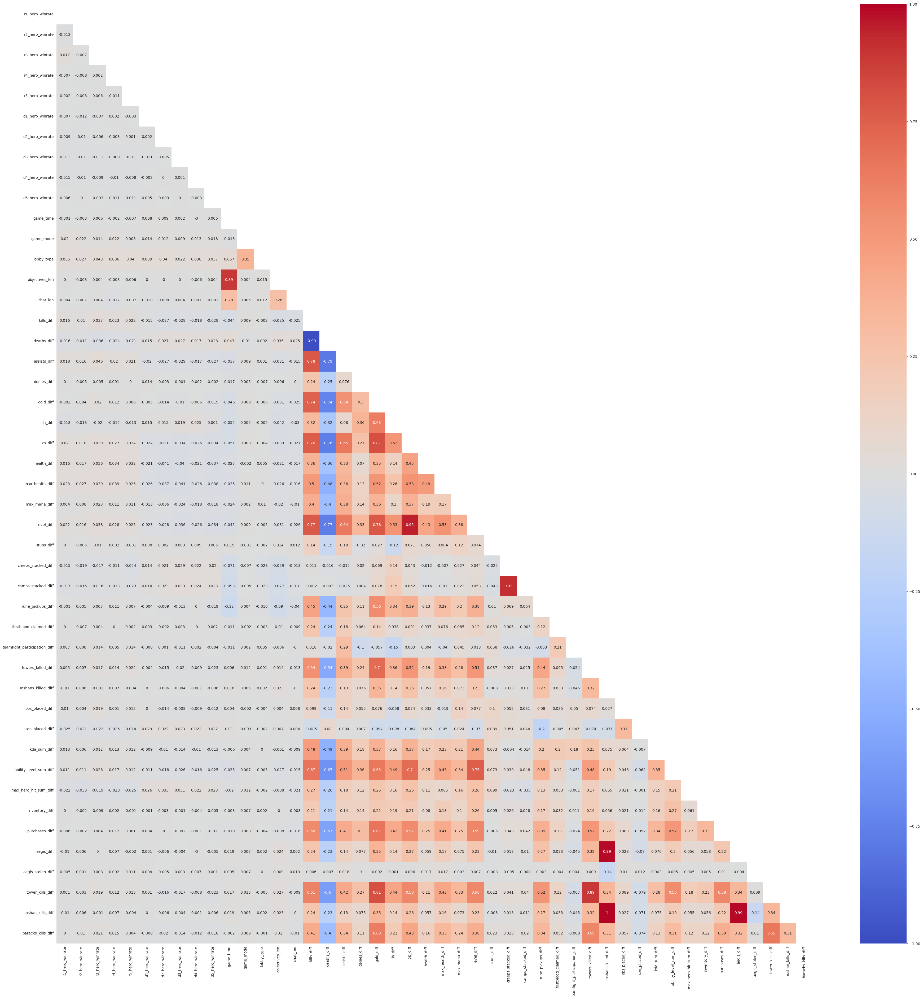

In [130]:
corr_heatmap(train1_dataset)


XGBClassifier cross val roc_auc-score: 0.8201570611668713
accuracy_score: 0.7345951629863302
precision_score: 0.7419984387197502
recall_score: 0.7597921662669864
f1_score: 0.7507898894154817
roc_auc_score: 0.733202785308371
              precision    recall  f1-score   support

           0       0.73      0.71      0.72      4506
           1       0.74      0.76      0.75      5004

    accuracy                           0.73      9510
   macro avg       0.73      0.73      0.73      9510
weighted avg       0.73      0.73      0.73      9510


XGBRFClassifier cross val roc_auc-score: 0.8211829435912275
accuracy_score: 0.7315457413249211
precision_score: 0.7297094657919401
recall_score: 0.7779776179056754
f1_score: 0.7530708966050876
roc_auc_score: 0.7289799319000193
              precision    recall  f1-score   support

           0       0.73      0.68      0.71      4506
           1       0.73      0.78      0.75      5004

    accuracy                           0.73      9510
  

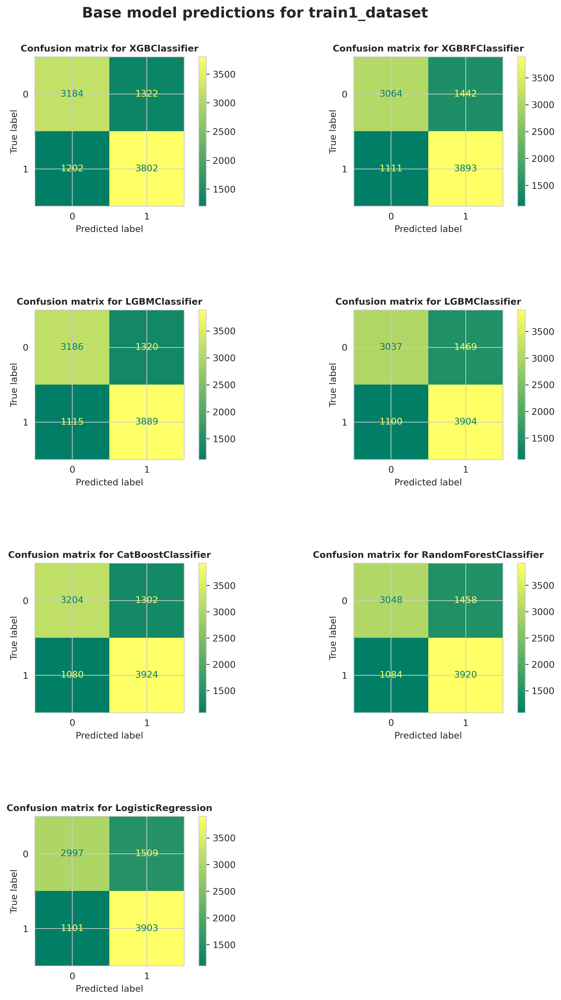

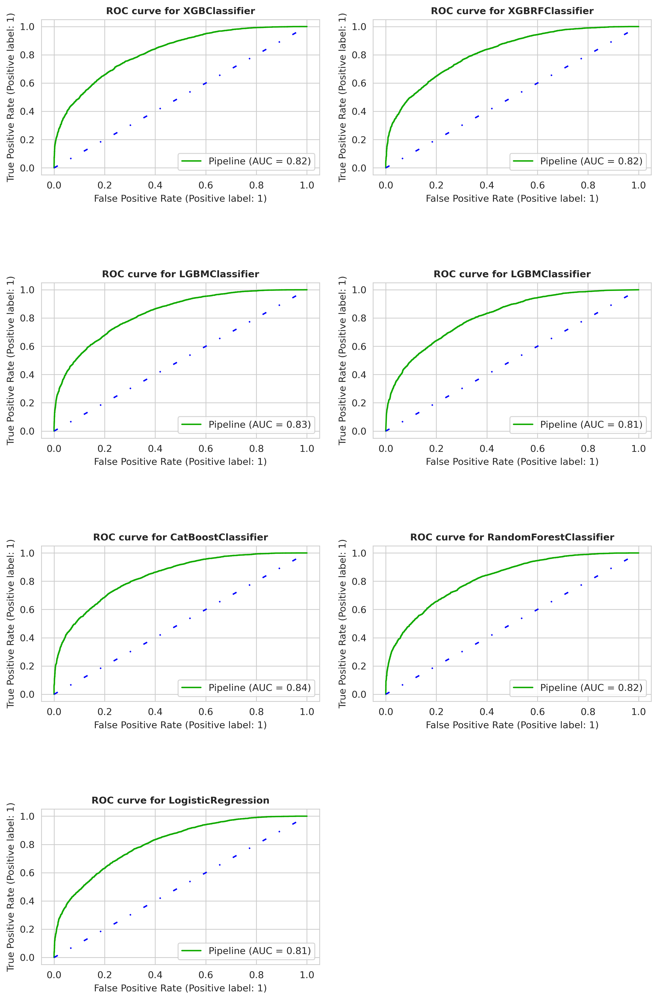

In [111]:
# for train1_dataset
base_models = [("XGB", xgb), ("XGB_RF", xgb_rf), ("LGBM", lgbm), 
               ("LGBM_RF", lgbm_rf), ("CAT", cat), ("rf", rf_model), ("LogR", lr)]

fig1, axes1 = plt.subplots(ncols=2, nrows=4, figsize=(10, 15), dpi=300)
fig2, axes2 = plt.subplots(ncols=2, nrows=4, figsize=(10, 15), dpi=300)

X = train1_dataset.values
y = df_heroes_ids['radiant_win'].values.astype("int8")
X_train, X_valid, y_train, y_valid = train_test_split(X, y, 
                                                      test_size=0.3,
                                                      random_state=SEED)

build_base_models(base_models, X_train, X_valid, y_train, y_valid)

fig1.delaxes(axes1[3][1])
fig2.delaxes(axes2[3][1])
fig1.tight_layout(pad=2, w_pad=2, h_pad=7)
fig2.tight_layout(pad=2, w_pad=2, h_pad=7)
fig1.suptitle("Base model predictions for train1_dataset", fontsize=16, fontweight='bold', y=1.02)
plt.show();

In [131]:
def class_stats(X, y):
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, 
                                                          test_size=0.3, 
                                                          random_state=SEED)
    clf = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
    clf.fit(X_train, y_train)
    scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring="roc_auc")
    print(f'cross val roc_auc-score: {scores.mean()}')

    y_pred = clf.predict(X_valid)
    y_score = clf.predict_proba(X_valid)

    for metric in metrics:
        print(f'{metric.__name__}: {metric(y_valid, y_pred)}')
        # if accuracy_score:
        #     print(f'{metric.__name__}: {metric(y_test, y_pred)}')
        # else:
        #     print(f'{metric.__name__}: {metric(y_test, y_pred, average="macro")}')

    print(classification_report(y_valid, y_pred))

    feature_importance = clf.feature_importances_
    sorted_idx = np.argsort(feature_importance)
    fig = plt.figure(figsize=(12, 10), dpi=300)
    plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
    plt.yticks(range(len(sorted_idx)), np.array(X.columns)[sorted_idx])
    plt.title('Feature Importance for train1_dataset')

In [132]:
def submission(X_train, y_train, X_test, model):
    X_train = X_train.values
    
    model.fit(X_train, y_train)    
    y_test_pred = model.predict_proba(X_test.values)[:, 1]
    df_submission = pd.DataFrame({"radiant_win_prob": y_test_pred}, index=X_test.index)
    
    submission_filename = "submissions/submission_{}.csv".format(
    datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S"))
    df_submission.to_csv(submission_filename)
    print("Файл посылки сохранен, как: {}".format(submission_filename))

In [133]:
y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
cat.fit(train1_dataset.values, y_train)    
y_test_pred = cat.predict_proba(test1_dataset.values)[:, 1]
df_submission = pd.DataFrame({"radiant_win_prob": y_test_pred}, index=test1_dataset.index)
df_submission

,radiant_win_prob
match_id_hash,
a400b8f29dece5f4d266f49f1ae2e98a,0.186699
46a0ddce8f7ed2a8d9bd5edcbb925682,0.880122
b1b35ff97723d9b7ade1c9c3cf48f770,0.558761
ab3cc6ccac661a1385e73a2e9f21313a,0.506715
54aaab1cb8cc5df3c253641618673266,0.778530
...,...
03f683fed8cf6f03b735e2ee2a942698,0.775591
06e2b42495855647830ccc6d466f913c,0.269040
defd0caeed6ea83d7d5fbdec013fe7d1,0.147220


In [166]:
y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
submission(train1_dataset, y_train, test1_dataset, cat)

Файл посылки сохранен, как: submissions/submission_2023-04-09_23-45-39.csv


In [134]:
train2_dataset = train1_dataset.drop(columns=["inventory_diff", "purchases_diff"], axis=1)
test2_dataset = test1_dataset.drop(columns=["inventory_diff", "purchases_diff"], axis=1)

y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
cat.fit(train2_dataset.values, y_train)    
y_test_pred = cat.predict_proba(test2_dataset.values)[:, 1]
df_submission = pd.DataFrame({"radiant_win_prob": y_test_pred}, index=test1_dataset.index)
df_submission

,radiant_win_prob
match_id_hash,
a400b8f29dece5f4d266f49f1ae2e98a,0.191151
46a0ddce8f7ed2a8d9bd5edcbb925682,0.857768
b1b35ff97723d9b7ade1c9c3cf48f770,0.475180
ab3cc6ccac661a1385e73a2e9f21313a,0.520344
54aaab1cb8cc5df3c253641618673266,0.769843
...,...
03f683fed8cf6f03b735e2ee2a942698,0.743449
06e2b42495855647830ccc6d466f913c,0.156786
defd0caeed6ea83d7d5fbdec013fe7d1,0.130719


cross val roc_auc-score: 0.8367889298029155
accuracy_score: 0.7479495268138802
precision_score: 0.7504322766570605
recall_score: 0.7805755395683454
f1_score: 0.7652071701439906
roc_auc_score: 0.7461466246443591
              precision    recall  f1-score   support

           0       0.74      0.71      0.73      4506
           1       0.75      0.78      0.77      5004

    accuracy                           0.75      9510
   macro avg       0.75      0.75      0.75      9510
weighted avg       0.75      0.75      0.75      9510



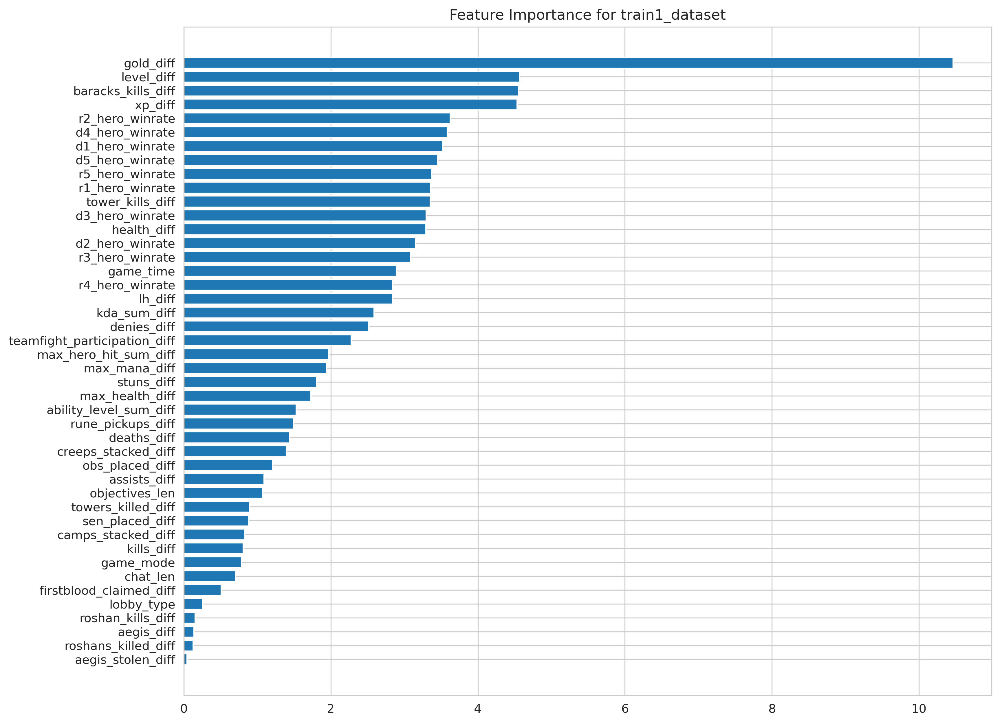

In [176]:
class_stats(train2_dataset, y_train)

In [173]:
y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
submission(train2_dataset, y_train, test2_dataset, cat)

Файл посылки сохранен, как: submissions/submission_2023-04-09_23-56-25.csv


In [135]:
# the best one for 2023-04-10 00:17
train3_dataset = pd.concat([train1_dataset.drop(columns=["inventory_diff", "purchases_diff"], axis=1), 
                            coords_df["place_diff"]], axis=1)
test3_dataset = pd.concat([test1_dataset.drop(columns=["inventory_diff", "purchases_diff"], axis=1), 
                           coords_df_test["place_diff"]], axis=1)

In [185]:
y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
cat.fit(train3_dataset.values, y_train)    
y_test_pred = cat.predict_proba(test3_dataset.values)[:, 1]
df_submission = pd.DataFrame({"radiant_win_prob": y_test_pred}, index=test3_dataset.index)
df_submission

,radiant_win_prob
match_id_hash,
a400b8f29dece5f4d266f49f1ae2e98a,0.163105
46a0ddce8f7ed2a8d9bd5edcbb925682,0.863633
b1b35ff97723d9b7ade1c9c3cf48f770,0.499798
ab3cc6ccac661a1385e73a2e9f21313a,0.534593
54aaab1cb8cc5df3c253641618673266,0.809508
...,...
03f683fed8cf6f03b735e2ee2a942698,0.728375
06e2b42495855647830ccc6d466f913c,0.245505
defd0caeed6ea83d7d5fbdec013fe7d1,0.150601


cross val roc_auc-score: 0.8368179145520964
accuracy_score: 0.7472134595162986
precision_score: 0.7488514548238897
recall_score: 0.7817745803357314
f1_score: 0.7649589362534218
roc_auc_score: 0.7453036239450517
              precision    recall  f1-score   support

           0       0.75      0.71      0.73      4506
           1       0.75      0.78      0.76      5004

    accuracy                           0.75      9510
   macro avg       0.75      0.75      0.75      9510
weighted avg       0.75      0.75      0.75      9510



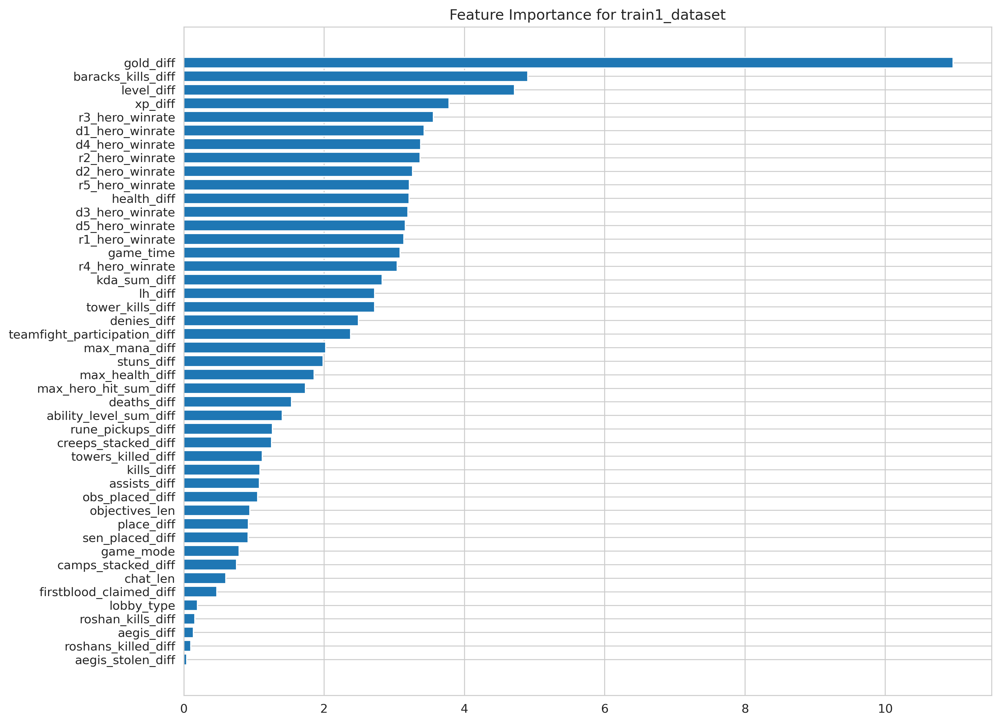

In [186]:
class_stats(train3_dataset, y_train)

In [187]:
y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
submission(train3_dataset, y_train, test3_dataset, cat)

Файл посылки сохранен, как: submissions/submission_2023-04-10_00-14-32.csv


(<Figure size 4500x4500 with 2 Axes>, <AxesSubplot:>)

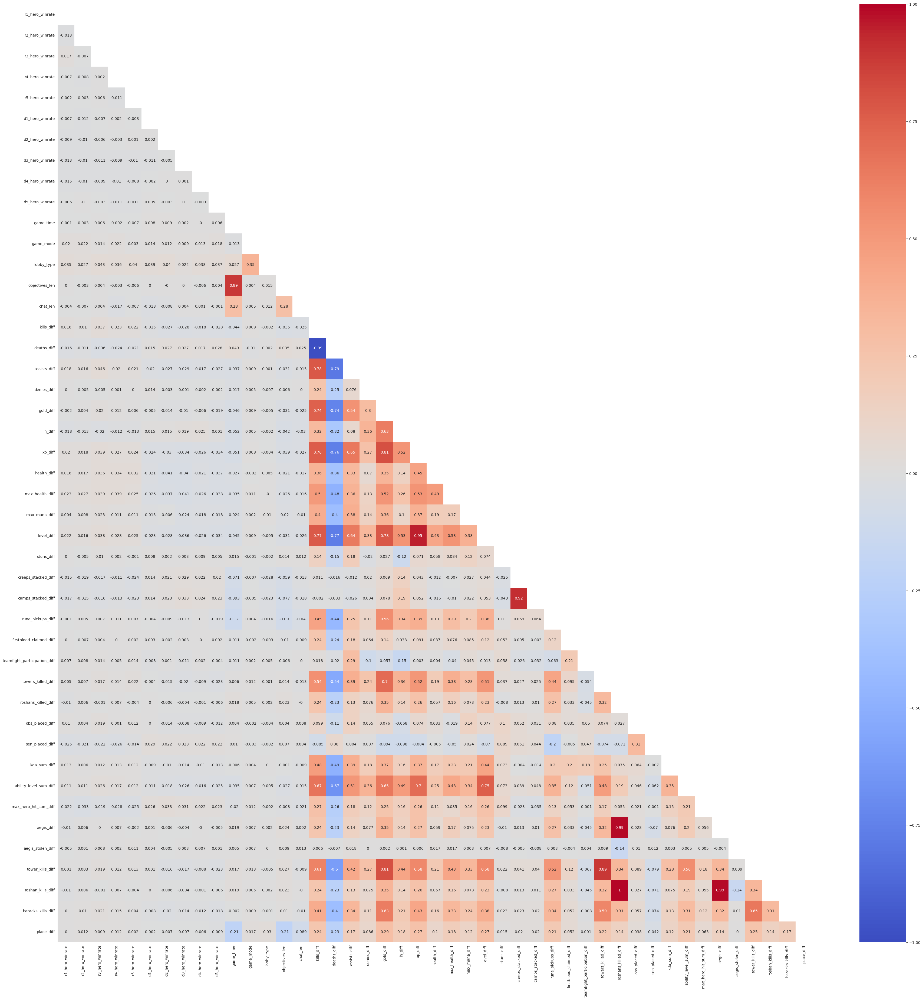

In [193]:
corr_heatmap(train3_dataset)

In [137]:
# the best score for 2023-04-10 00:59
train4_dataset = pd.concat([df_heroes_ids.iloc[:, 11:], df_train_features_raw.iloc[:, :5],
                           command_stats[command_stats.columns[[i.endswith('ratio') for i in 
                                                                          command_stats.columns]]],
                           df_train_features_raw[df_train_features_raw.columns[[i.endswith('diff') for i in 
                                                                                df_train_features_raw.columns]]]], axis=1)
test4_dataset = pd.concat([df_heroes_ids_test.iloc[:, 10:], df_test_features_raw.iloc[:, :5],
                           command_stats_test[command_stats_test.columns[[i.endswith('ratio') for i in 
                                                                          command_stats_test.columns]]],
                           df_test_features_raw[df_test_features_raw.columns[[i.endswith('diff') for i in 
                                                                                df_test_features_raw.columns]]]], axis=1)

cross val roc_auc-score: 0.8395503407428357
accuracy_score: 0.7497371188222923
precision_score: 0.7528912875867386
recall_score: 0.7805755395683454
f1_score: 0.7664835164835164
roc_auc_score: 0.7480329983682827
              precision    recall  f1-score   support

           0       0.75      0.72      0.73      4506
           1       0.75      0.78      0.77      5004

    accuracy                           0.75      9510
   macro avg       0.75      0.75      0.75      9510
weighted avg       0.75      0.75      0.75      9510



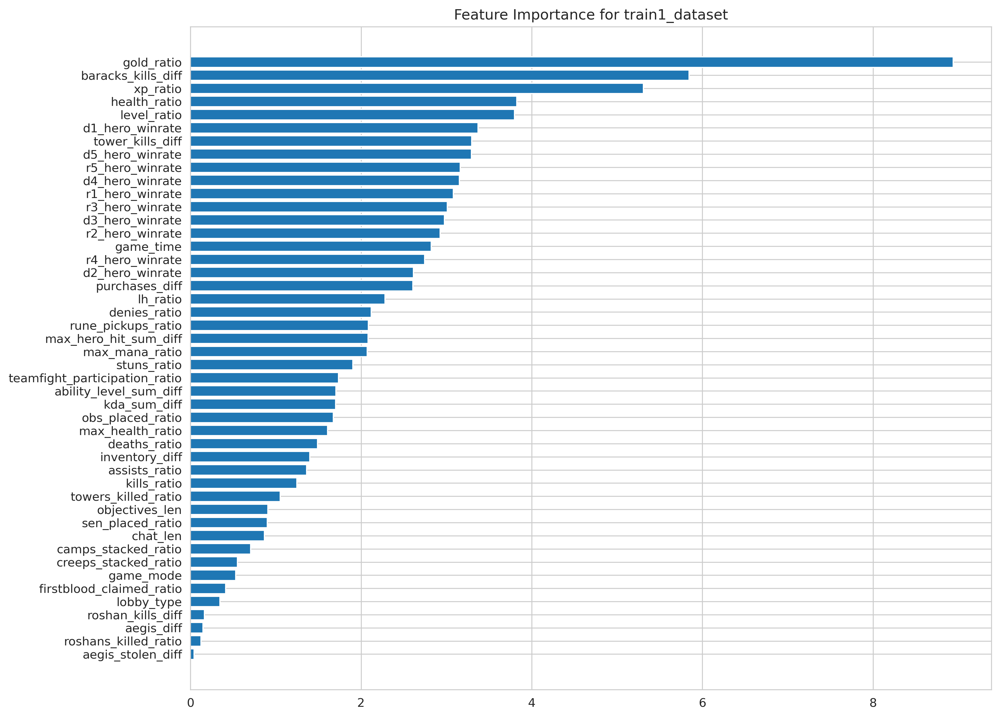

In [243]:
class_stats(train4_dataset, y_train)

In [426]:
y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
cat.fit(train4_dataset.values, y_train)    
y_test_pred = cat.predict_proba(test4_dataset.values)[:, 1]
df_submission = pd.DataFrame({"radiant_win_prob": y_test_pred}, index=test4_dataset.index)
df_submission

,radiant_win_prob
match_id_hash,
a400b8f29dece5f4d266f49f1ae2e98a,0.134980
46a0ddce8f7ed2a8d9bd5edcbb925682,0.891215
b1b35ff97723d9b7ade1c9c3cf48f770,0.490292
ab3cc6ccac661a1385e73a2e9f21313a,0.454668
54aaab1cb8cc5df3c253641618673266,0.735768
...,...
03f683fed8cf6f03b735e2ee2a942698,0.767657
06e2b42495855647830ccc6d466f913c,0.155492
defd0caeed6ea83d7d5fbdec013fe7d1,0.137098


In [244]:
y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
submission(train4_dataset, y_train, test4_dataset, cat)

Файл посылки сохранен, как: submissions/submission_2023-04-10_00-54-33.csv


In [141]:
def class_stats_tuned(X, y):
    X_train, X_valid, y_train, y_valid = train_test_split(X, y, 
                                                          test_size=0.3, 
                                                          random_state=SEED)
    clf = catboost.CatBoostClassifier(verbose=0, random_seed=SEED, learning_rate=0.1, depth=3, n_estimators=300)
    clf.fit(X_train, y_train)
    scores = cross_val_score(clf, X_train, y_train, cv=cv, scoring="roc_auc")
    print(f'cross val roc_auc-score: {scores.mean()}')

    y_pred = clf.predict(X_valid)
    y_score = clf.predict_proba(X_valid)

    for metric in metrics:
        print(f'{metric.__name__}: {metric(y_valid, y_pred)}')
        # if accuracy_score:
        #     print(f'{metric.__name__}: {metric(y_test, y_pred)}')
        # else:
        #     print(f'{metric.__name__}: {metric(y_test, y_pred, average="macro")}')

    print(classification_report(y_valid, y_pred))

    feature_importance = clf.feature_importances_
    sorted_idx = np.argsort(feature_importance)
    fig = plt.figure(figsize=(12, 10), dpi=300)
    plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
    plt.yticks(range(len(sorted_idx)), np.array(X.columns)[sorted_idx])
    plt.title('Feature Importance for train1_dataset')

In [84]:
def tuning_model(model, param_grid, X_train, y_train, X_valid, y_valid):
    pipeline = make_pipeline(model)
    grid_pipeline = GridSearchCV(pipeline, param_grid=param_grid, cv=cv, scoring='roc_auc', n_jobs=-1)
    grid_pipeline.fit(X_train, y_train)
    print(grid_pipeline.best_estimator_)
    print(grid_pipeline.best_params_)
    print(grid_pipeline.best_score_)
    
    y_pred = grid_pipeline.best_estimator_.predict(X_valid)

    for metric in metrics:
        # if accuracy_score:
        #     print(f'{metric.__name__}: {metric(y_test, y_pred)}')
        # else:
        #     print(f'{metric.__name__}: {metric(y_test, y_pred, average="macro")}')
        print(f'{metric.__name__}: {metric(y_valid, y_pred)}')
    print(classification_report(y_valid, y_pred))

    fig, axes = plt.subplots(2, 1, dpi=300)
    conf_mat = confusion_matrix(y_true=y_valid, y_pred=y_pred)    
    axes[0].set_title(f'Confusion matrix for {pipeline[0].__class__.__name__}', fontsize=10, fontweight='bold')
    ConfusionMatrixDisplay(conf_mat).plot(ax = axes[0], cmap="summer")

    axes[1].set_title(f'ROC curve for {pipeline[0].__class__.__name__}', size=10, weight='bold')
    RocCurveDisplay.from_estimator(grid_pipeline.best_estimator_, X_valid, y_valid, color="#1a0", ax=axes[1])
    axes[1].plot([0, 1], color='b', linestyle=(0, (3, 10, 1, 10)))

Pipeline(steps=[('catboostclassifier',
                 <catboost.core.CatBoostClassifier object at 0x7f8e5444e220>)])
{'catboostclassifier__learning_rate': 0.1, 'catboostclassifier__max_depth': 3, 'catboostclassifier__n_estimators': 300}
0.8405236488458339
accuracy_score: 0.7502628811777077
precision_score: 0.7527398577196693
recall_score: 0.7823741007194245
f1_score: 0.7672709456148947
              precision    recall  f1-score   support

           0       0.75      0.71      0.73      4506
           1       0.75      0.78      0.77      5004

    accuracy                           0.75      9510
   macro avg       0.75      0.75      0.75      9510
weighted avg       0.75      0.75      0.75      9510



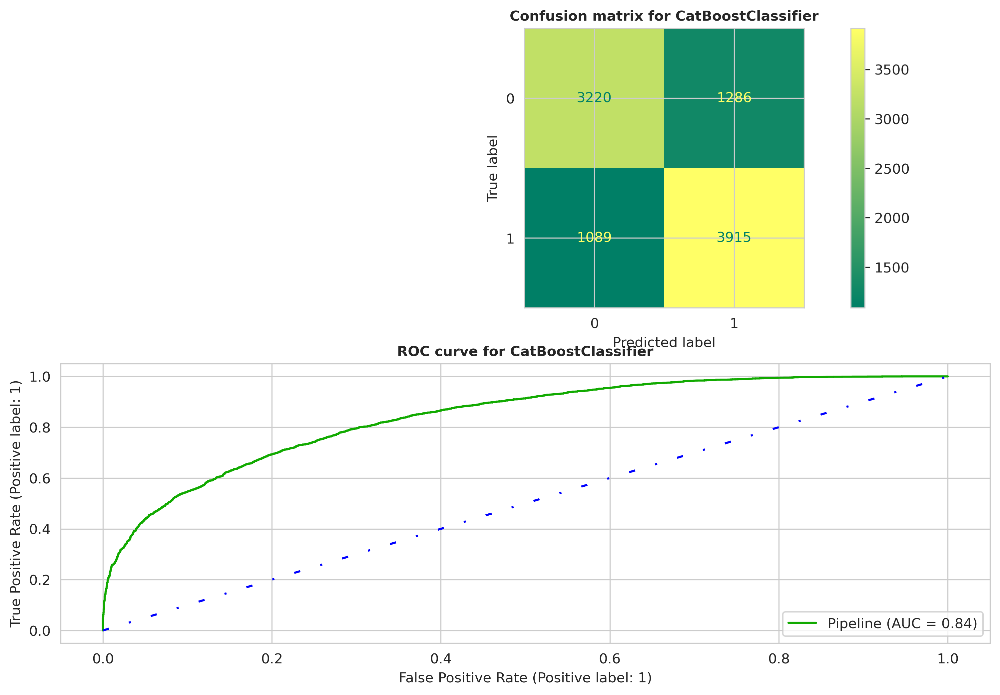

In [420]:
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
metrics = [accuracy_score, precision_score, recall_score, f1_score]

y = df_train_targets["radiant_win"].values.astype("int8")
X_train, X_valid, y_train, y_valid = train_test_split(train4_dataset.values, y, 
                                                      test_size=0.3, 
                                                      random_state=SEED)
cat_grid = {
        'catboostclassifier__learning_rate': [0.01, 0.05, 0.1, 0.2, 0.5, 1],
        'catboostclassifier__max_depth': [2, 3, 5, 8, 10], 
        'catboostclassifier__n_estimators': [100, 200, 300],
        # 'catboostclassifier__subsample': np.arange(0.5, 1.25, 0.25)
        }

tuning_model(cat, cat_grid, X_train, y_train, X_valid, y_valid)

In [139]:
y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED, learning_rate=0.1, depth=3, n_estimators=300)
cat.fit(train4_dataset.values, y_train)    
y_test_pred = cat.predict_proba(test4_dataset.values)[:, 1]
df_submission = pd.DataFrame({"radiant_win_prob": y_test_pred}, index=test4_dataset.index)
df_submission

,radiant_win_prob
match_id_hash,
a400b8f29dece5f4d266f49f1ae2e98a,0.159057
46a0ddce8f7ed2a8d9bd5edcbb925682,0.895728
b1b35ff97723d9b7ade1c9c3cf48f770,0.457737
ab3cc6ccac661a1385e73a2e9f21313a,0.470342
54aaab1cb8cc5df3c253641618673266,0.757813
...,...
03f683fed8cf6f03b735e2ee2a942698,0.779972
06e2b42495855647830ccc6d466f913c,0.150973
defd0caeed6ea83d7d5fbdec013fe7d1,0.145703


In [425]:
y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED, learning_rate=0.1, depth=3, n_estimators=300)
cat.fit(train4_dataset.values, y_train)    
y_test_pred = cat.predict_proba(test4_dataset.values)[:, 1]
df_submission = pd.DataFrame({"radiant_win_prob": y_test_pred}, index=test4_dataset.index)
df_submission

,radiant_win_prob
match_id_hash,
a400b8f29dece5f4d266f49f1ae2e98a,0.071429
46a0ddce8f7ed2a8d9bd5edcbb925682,0.899185
b1b35ff97723d9b7ade1c9c3cf48f770,0.517824
ab3cc6ccac661a1385e73a2e9f21313a,0.432472
54aaab1cb8cc5df3c253641618673266,0.757281
...,...
03f683fed8cf6f03b735e2ee2a942698,0.804708
06e2b42495855647830ccc6d466f913c,0.169371
defd0caeed6ea83d7d5fbdec013fe7d1,0.105680


cross val roc_auc-score: 0.8405236488458339
accuracy_score: 0.7502628811777077
precision_score: 0.7527398577196693
recall_score: 0.7823741007194245
f1_score: 0.7672709456148947
              precision    recall  f1-score   support

           0       0.75      0.71      0.73      4506
           1       0.75      0.78      0.77      5004

    accuracy                           0.75      9510
   macro avg       0.75      0.75      0.75      9510
weighted avg       0.75      0.75      0.75      9510



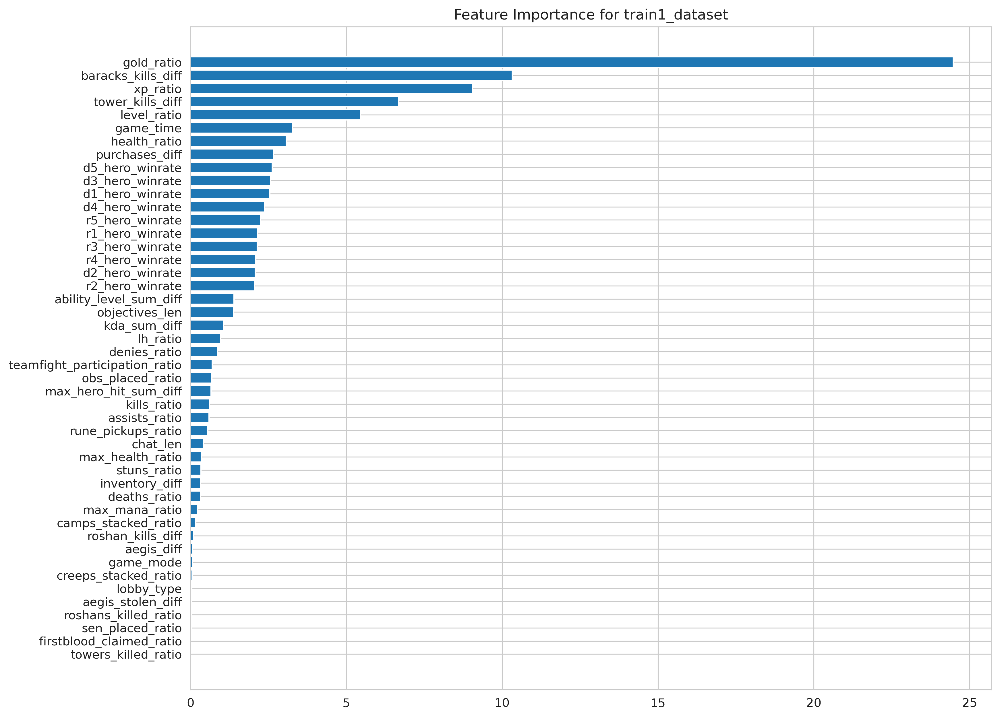

In [427]:
class_stats_tuned(train4_dataset, y_train)

In [428]:
# the best one 0.85188 roc_auc on kaggle
y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED, learning_rate=0.1, depth=3, n_estimators=300)
submission(train4_dataset, y_train, test4_dataset, cat)

Файл посылки сохранен, как: submissions/submission_2023-04-10_04-09-14.csv


In [142]:
train5_dataset = pd.concat([train4_dataset, coords_df[["r_place_sum", "d_place_sum"]]], axis=1)
test5_dataset = pd.concat([test4_dataset, coords_df_test[["r_place_sum", "d_place_sum"]]], axis=1)

In [294]:
y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
cat.fit(train5_dataset.values, y_train)    
y_test_pred = cat.predict_proba(test5_dataset.values)[:, 1]
df_submission = pd.DataFrame({"radiant_win_prob": y_test_pred}, index=test5_dataset.index)
df_submission

,radiant_win_prob
match_id_hash,
a400b8f29dece5f4d266f49f1ae2e98a,0.089270
46a0ddce8f7ed2a8d9bd5edcbb925682,0.895092
b1b35ff97723d9b7ade1c9c3cf48f770,0.533268
ab3cc6ccac661a1385e73a2e9f21313a,0.432163
54aaab1cb8cc5df3c253641618673266,0.750655
...,...
03f683fed8cf6f03b735e2ee2a942698,0.734023
06e2b42495855647830ccc6d466f913c,0.137287
defd0caeed6ea83d7d5fbdec013fe7d1,0.125943


cross val roc_auc-score: 0.8382258752315634
accuracy_score: 0.7477392218717139
precision_score: 0.7495688829277639
recall_score: 0.7817745803357314
f1_score: 0.7653330724836155
roc_auc_score: 0.7458584397462057
              precision    recall  f1-score   support

           0       0.75      0.71      0.73      4506
           1       0.75      0.78      0.77      5004

    accuracy                           0.75      9510
   macro avg       0.75      0.75      0.75      9510
weighted avg       0.75      0.75      0.75      9510



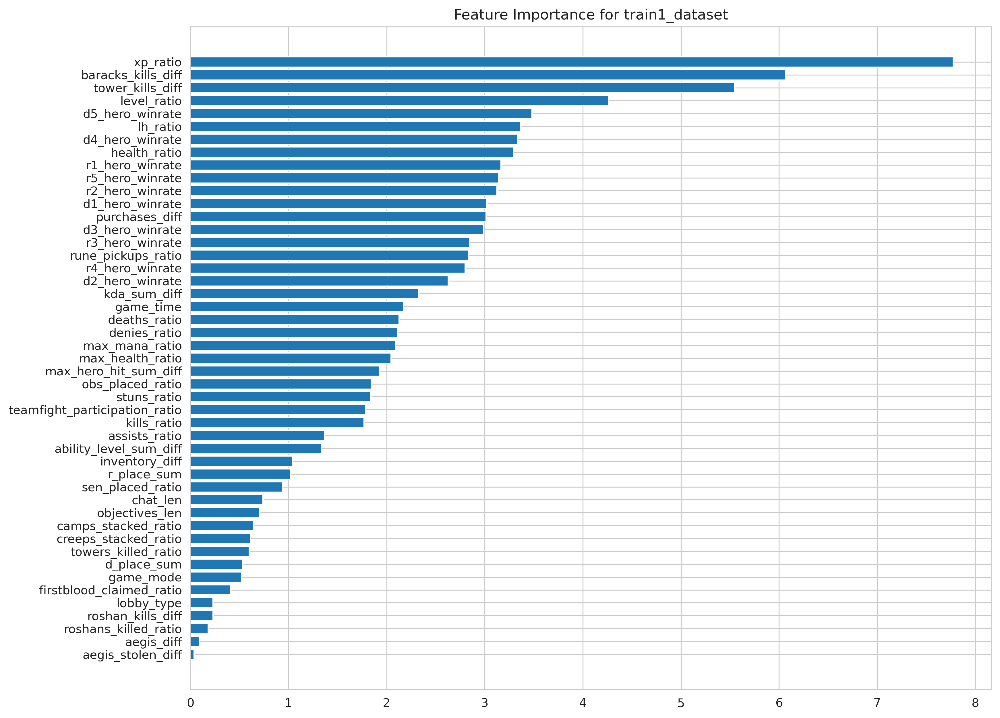

In [295]:
class_stats(train5_dataset, y_train)

In [296]:
y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
submission(train5_dataset, y_train, test5_dataset, cat)

Файл посылки сохранен, как: submissions/submission_2023-04-10_01-26-33.csv


In [314]:
train6_dataset = pd.concat([train5_dataset, df_heroes_ids.iloc[:, :10]], axis=1)
test6_dataset = pd.concat([test5_dataset, df_heroes_ids_test.iloc[:, :10]], axis=1)

In [315]:
y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
cat.fit(train6_dataset.values, y_train)    
y_test_pred = cat.predict_proba(test6_dataset.values)[:, 1]
df_submission = pd.DataFrame({"radiant_win_prob": y_test_pred}, index=test6_dataset.index)
df_submission

,radiant_win_prob
match_id_hash,
a400b8f29dece5f4d266f49f1ae2e98a,0.090805
46a0ddce8f7ed2a8d9bd5edcbb925682,0.888656
b1b35ff97723d9b7ade1c9c3cf48f770,0.554858
ab3cc6ccac661a1385e73a2e9f21313a,0.444463
54aaab1cb8cc5df3c253641618673266,0.750807
...,...
03f683fed8cf6f03b735e2ee2a942698,0.788547
06e2b42495855647830ccc6d466f913c,0.165602
defd0caeed6ea83d7d5fbdec013fe7d1,0.106783


cross val roc_auc-score: 0.8395408130204955
accuracy_score: 0.7480546792849632
precision_score: 0.7506728181468666
recall_score: 0.7803756994404476
f1_score: 0.7652361356065059
roc_auc_score: 0.7462686309008718
              precision    recall  f1-score   support

           0       0.74      0.71      0.73      4506
           1       0.75      0.78      0.77      5004

    accuracy                           0.75      9510
   macro avg       0.75      0.75      0.75      9510
weighted avg       0.75      0.75      0.75      9510



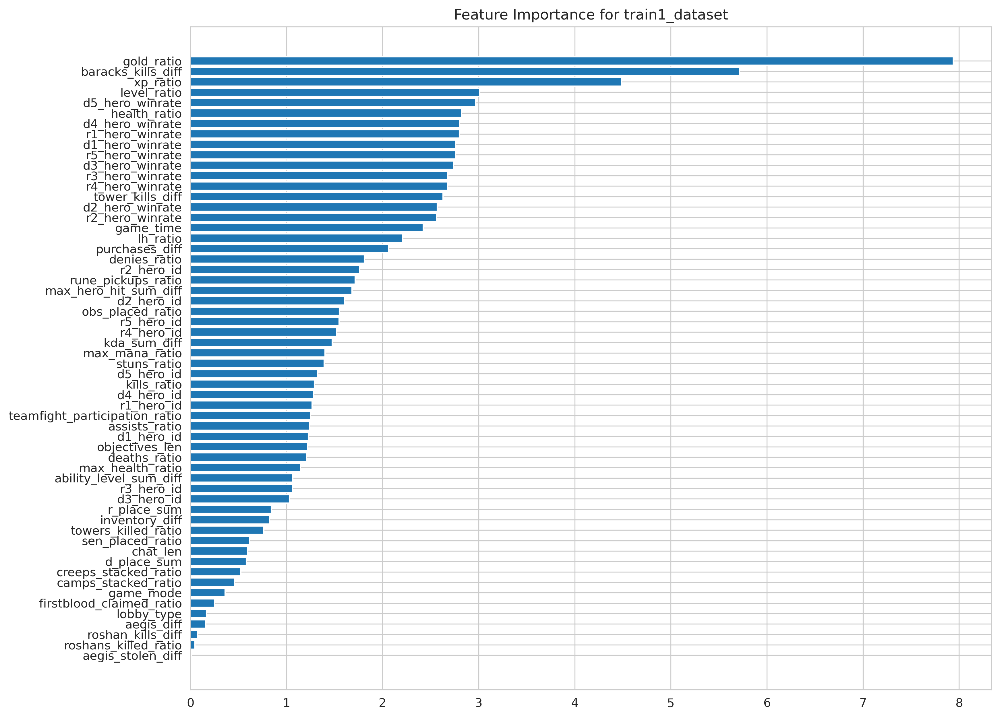

In [316]:
class_stats(train6_dataset, y_train)

In [307]:
y_train = df_train_targets["radiant_win"].values.astype("int8")
cat = catboost.CatBoostClassifier(verbose=0, random_seed=SEED)
submission(train4_dataset, y_train, test6_dataset, cat)

Файл посылки сохранен, как: submissions/submission_2023-04-10_01-41-13.csv


Thus, much more else can be tried: 

1) more reasonably engineered features;
2) training individual models for different time intervals of the game; 
3) trying to normalize some features for the duration of the game; 
4) load other features from .jsonl file, and so on.